# Capstone Project - Hector Sanchez Johnson
## House Price Prediction
### Context
Housing prices are an important reflection of the economy, and housing price ranges are of great interest for both buyers and sellers. Ask a home buyer to describe their dream house, and they probably won’t begin with the height of the basement ceiling or the proximity to an east-west railroad. A house value is simply more than location and square footage. Like the features that make
up a person, an educated party would want to know all aspects that give a house its value. For example, you want to sell a house and you don’t know the price which you may expect — it can’t be too low or too high. To find house price you usually try to find similar properties in your neighborhood and based on gathered data you will try to assess your house price.
###Objective 
The objective of this problem statement is to predict the housing prices of a town or a suburb based on the features of the locality provided and identify the most important features to consider while predicting the prices.

### Data Dictionary
This dataset has 23 features, price being the target variable. The details of all the features are given
below:
- cid: a notation for a house
- dayhours: Date house was sold
- **price: Price is prediction target (in $) - TARGET**
- room_bed: Number of Bedrooms per house
- room_bath: Number of bathrooms per bedrooms
- living_measure: square footage of the home
- lot_measure: square footage of the lot
- ceil: Total floors (levels) in house
- coast: House which has a view to a waterfront (0 - No, 1 - Yes)
- sight: Has been viewed
- condition: How good the condition is (Overall out of 5)
- quality: grade given to the housing unit, based on grading system
- ceil_measure: square footage of house apart from basement
- basement_measure: square footage of the basement
- yr_built: Built Year
- yr_renovated: Year when house was renovated
- zipcode: zip code
- lat: Latitude coordinate
- long: Longitude coordinate
- living_measure15: Living room area in 2015 (implies-- some renovations) This might or might not have affected the lot size area
- lot_measure15: lotSize area in 2015 (implies-- some renovations)
- furnished: Based on the quality of room (0 - No, 1 - Yes)
- total_area: Measure of both living and lot

## Google Colab Performance Optimization: 
Use _either_ Tensorflow GPU _or_ TPU

- Navigate to Edit→Notebook Settings
- select GPU or TPU from the Hardware Accelerator drop-down

### Enable Tensorflow for GPU usage

In [388]:
# import tensorflow as tf
# device_name = tf.test.gpu_device_name()
# if device_name != '/device:GPU:0':
#   raise SystemError('GPU device not found')
# print('Found GPU at: {}'.format(device_name))

In [389]:
# from tensorflow.python.client import device_lib
# device_lib.list_local_devices()

### Enable TPU

In [390]:
# import tensorflow as tf
# print("Tensorflow version " + tf.__version__)

# try:
#   tpu = tf.distribute.cluster_resolver.TPUClusterResolver()  # TPU detection
#   print('Running on TPU ', tpu.cluster_spec().as_dict()['worker'])
# except ValueError:
#   raise BaseException('ERROR: Not connected to a TPU runtime; please see the previous cell in this notebook for instructions!')

# tf.config.experimental_connect_to_cluster(tpu)
# tf.tpu.experimental.initialize_tpu_system(tpu)
# tpu_strategy = tf.distribute.TPUStrategy(tpu)

## Avoid network disconnections when running long models
### Only use when running long models! (Or you will be booted from Colab)

In [391]:
# %%javascript
# function ClickConnect(){
# console.log("Working");
# document.querySelector("colab-toolbar-button#connect").click()
# }setInterval(ClickConnect,60000)

## Import My Custom DsmlFunctions Python script as Module

In [392]:
# Install required dependency
!pip install import_ipynb

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [393]:
# Import the package
import import_ipynb

In [394]:
# Import a custom Python functions file
# First upload file to content folder

import dsmlfunctions as DsmlFunctions

## Install necessary dependencies

In [395]:
# SciKit Plot for graphing
# !pip install scikit-plot

# FastProgress for Progress Bar in For loops
# !pip install fastprogress

In [396]:
# Install the USZIPCODE package for related info
!pip install uszipcode

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [397]:
# Install Kmodes for clustering
!pip install kmodes

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


## Import required packages

In [398]:
import datetime

# Progress bar for loops
from fastprogress import master_bar, progress_bar

# Importing the USZIPCODE Search Engine
from uszipcode import SearchEngine

# Used to ignore the warning given as output of the code
import warnings                                 
warnings.filterwarnings('ignore')

# import the important packages
import pandas as pd               # library used for data manipulation and analysis
import numpy as np                # library used for working with arrays
import math                       # library for math operations
import matplotlib.pyplot as plt   # library for plots and visualizations
%matplotlib inline     
import seaborn as sns             # library for visualizations
sns.set_style('darkgrid')

# Import SKLearn libraries
from sklearn.preprocessing import  StandardScaler, scale  # or MinMaxScaler
from sklearn.cluster import KMeans
from kmodes.kprototypes import KPrototypes            # For K clustering categorical columns
from sklearn.model_selection import train_test_split  # To split data into X/y train/test

# StatsModels libraries
import statsmodels.api as sm                          # statsmodels
from statsmodels.formula.api import ols               # OLS Linear Regression

# Models
from sklearn.linear_model import LinearRegression     # Linear Regression for Cross Validation
from sklearn.model_selection import cross_val_score   # Cross Validation by doing K-Folds

from sklearn.tree import DecisionTreeRegressor        # Decision tree regressor
from sklearn.tree import plot_tree                    # Plot Decision Tree
from sklearn.ensemble import RandomForestRegressor    # Random Forest regressor

# Get Metrics to evlauate models: MAE, MAPE, MSE, R2
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, mean_squared_error, r2_score       

# SciKit Plot Lib
# import scikitplot as skplt

In [399]:
# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)

## Mount gDrive & import data

In [400]:
# Import the dataset
data = pd.read_csv('/content/drive/MyDrive/DSML/GL-Capstone-Houses-03-2023/Dataset+-+House+Price+Prediction+-+innercity.xlsx+-+innercity.csv')



---

# EDA

## Data Analysis

### General Information

In [401]:
# Get general data shape, info, types, object/number columns, describe 
DsmlFunctions.getGeneralInfo(data)


Data Head


,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
0,3876100940,20150427T000000,600000,4.0,1.75,3050.0,9440.0,1,0,0.0,3,8.0,1800.0,1250.0,1966,0,98034,47.7228,-122.183,2020.0,8660.0,0.0,12490
1,3145600250,20150317T000000,190000,2.0,1.00,670.0,3101.0,1,0,0.0,4,6.0,670.0,0.0,1948,0,98118,47.5546,-122.274,1660.0,4100.0,0.0,3771
2,7129303070,20140820T000000,735000,4.0,2.75,3040.0,2415.0,2,1,4.0,3,8.0,3040.0,0.0,1966,0,98118,47.5188,-122.256,2620.0,2433.0,0.0,5455
3,7338220280,20141010T000000,257000,3.0,2.50,1740.0,3721.0,2,0,0.0,3,8.0,1740.0,0.0,2009,0,98002,47.3363,-122.213,2030.0,3794.0,0.0,5461
4,7950300670,20150218T000000,450000,2.0,1.00,1120.0,4590.0,1,0,0.0,3,7.0,1120.0,0.0,1924,0,98118,47.5663,-122.285,1120.0,5100.0,0.0,5710



Data Shape
(21613, 23)

Data Info
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   cid               21613 non-null  int64  
 1   dayhours          21613 non-null  object 
 2   price             21613 non-null  int64  
 3   room_bed          21505 non-null  float64
 4   room_bath         21505 non-null  float64
 5   living_measure    21596 non-null  float64
 6   lot_measure       21571 non-null  float64
 7   ceil              21571 non-null  object 
 8   coast             21612 non-null  object 
 9   sight             21556 non-null  float64
 10  condition         21556 non-null  object 
 11  quality           21612 non-null  float64
 12  ceil_measure      21612 non-null  float64
 13  basement          21612 non-null  float64
 14  yr_built          21612 non-null  object 
 15  yr_renovated      21613 non-null  int64  
 16  zipco

,cid,price,room_bed,room_bath,living_measure,lot_measure,sight,quality,ceil_measure,basement,yr_renovated,zipcode,lat,living_measure15,lot_measure15,furnished
0,3876100940,600000,4.0,1.75,3050.0,9440.0,0.0,8.0,1800.0,1250.0,0,98034,47.7228,2020.0,8660.0,0.0
1,3145600250,190000,2.0,1.00,670.0,3101.0,0.0,6.0,670.0,0.0,0,98118,47.5546,1660.0,4100.0,0.0
2,7129303070,735000,4.0,2.75,3040.0,2415.0,4.0,8.0,3040.0,0.0,0,98118,47.5188,2620.0,2433.0,0.0
3,7338220280,257000,3.0,2.50,1740.0,3721.0,0.0,8.0,1740.0,0.0,0,98002,47.3363,2030.0,3794.0,0.0
4,7950300670,450000,2.0,1.00,1120.0,4590.0,0.0,7.0,1120.0,0.0,0,98118,47.5663,1120.0,5100.0,0.0


(21613, 16)

Object Columns


,dayhours,ceil,coast,condition,yr_built,long,total_area
0,20150427T000000,1,0,3,1966,-122.183,12490
1,20150317T000000,1,0,4,1948,-122.274,3771
2,20140820T000000,2,1,3,1966,-122.256,5455
3,20141010T000000,2,0,3,2009,-122.213,5461
4,20150218T000000,1,0,3,1924,-122.285,5710


(21613, 7)


### Data Cleanup

#### Correcting Column Types
There are several Object columns that should contain Numbers:

ceil, coast, condition, yr_built, long, total_area

Let's review their unique values

In [402]:
data['ceil'].value_counts()

1      10647
2       8210
1.5     1905
3        610
2.5      161
$         30
3.5        8
Name: ceil, dtype: int64

In [403]:
data['coast'].value_counts()

0    21421
1      161
$       30
Name: coast, dtype: int64

In [404]:
data['condition'].value_counts()

3    13978
4     5655
5     1694
2      171
1       30
$       28
Name: condition, dtype: int64

In [405]:
data['yr_built'].value_counts()

2014    559
2006    454
2005    450
2004    433
2003    421
       ... 
1901     29
1902     27
1935     24
1934     21
$        14
Name: yr_built, Length: 117, dtype: int64

In [406]:
data['long'].value_counts()

-122.29     116
-122.3      111
-122.362    104
-122.291    100
-122.372     99
           ... 
-122.474      1
-121.711      1
-121.845      1
-121.737      1
-121.947      1
Name: long, Length: 753, dtype: int64

In [407]:
data['total_area'].value_counts()

$        39
6770     19
5940     19
7330     19
9060     19
         ..
15707     1
5355      1
12215     1
46580     1
38122     1
Name: total_area, Length: 11145, dtype: int64

In [408]:
# Several rows have $ as a value, forcing the columns to become type Object
# Since out of 21k+ rows these affect around 30-60 rows, we can consider them negligible and remove those rows

columnList = ['ceil', 'coast', 'condition', 'yr_built', 'long', 'total_area']
data = DsmlFunctions.getRemoveRowsWithValue(data, columnList, '$')


Removing "$" from columns

--- Removing "$" from "ceil" ---
1      10647
2       8210
1.5     1905
3        610
2.5      161
3.5        8
Name: ceil, dtype: int64

--- Removing "$" from "coast" ---
0    21421
1      161
Name: coast, dtype: int64

--- Removing "$" from "condition" ---
3    13958
4     5649
5     1690
2      171
1       30
Name: condition, dtype: int64

--- Removing "$" from "yr_built" ---
2014    558
2006    453
2005    448
2004    432
2003    420
       ... 
1933     30
1901     29
1902     27
1935     24
1934     21
Name: yr_built, Length: 116, dtype: int64

--- Removing "$" from "long" ---
-122.29     116
-122.3      111
-122.362    104
-122.291     99
-122.288     98
           ... 
-121.782      1
-122.454      1
-122.469      1
-122.479      1
-121.947      1
Name: long, Length: 752, dtype: int64

--- Removing "$" from "total_area" ---
8750      19
6770      19
5940      19
9820      19
7330      18
          ..
46580      1
15588      1
201037     1
26245      1

In [409]:
# And we need to convert the Object columns to Number so it keeps

data = DsmlFunctions.getConvertObjectToNumber(data, columnList)


Converting Columns to Number

--- Converted "ceil" to float64 ---

--- Converted "coast" to float64 ---

--- Converted "condition" to float64 ---

--- Converted "yr_built" to float64 ---

--- Converted "long" to float64 ---

--- Converted "total_area" to float64 ---


In [410]:
data.dtypes

cid                   int64
dayhours             object
price                 int64
room_bed            float64
room_bath           float64
living_measure      float64
lot_measure         float64
ceil                float64
coast               float64
sight               float64
condition           float64
quality             float64
ceil_measure        float64
basement            float64
yr_built            float64
yr_renovated          int64
zipcode               int64
lat                 float64
long                float64
living_measure15    float64
lot_measure15       float64
furnished           float64
total_area          float64
dtype: object

#### Null Handling

In [411]:
# Imputing Object columns with most frequent (mode) and Number columns with middle value (median)
data_nonull = DsmlFunctions.getNullHandler(data)


Data Null Handler
Nulls present: True
Nulls count: 563
cid                   0
dayhours              0
price                 0
room_bed             66
room_bath            66
living_measure       17
lot_measure          42
ceil                 42
coast                 1
sight                57
condition            57
quality               1
ceil_measure          1
basement              1
yr_built              1
yr_renovated          0
zipcode               0
lat                   0
long                  0
living_measure15    124
lot_measure15        29
furnished            29
total_area           29
dtype: int64
---------------
Imputing Object columns with most frequent (mode) and Number columns with middle value (median)
---------------
Confirming no nulls left
Nulls present: False
Nulls count: 0


#### Data Describe with clean data

In [412]:
DsmlFunctions.getDataDescribe(data)


Data Describe


,count,mean,std,min,25%,50%,75%,max
cid,21472.00000,4579188754.35237,2876049212.90620,1000102.00000,2123046572.50000,3904930470.00000,7305300711.25000,9900000190.00000
price,21472.00000,539936.32815,365063.92158,75000.00000,322000.00000,450000.00000,645000.00000,7700000.00000
room_bed,21472.00000,3.37002,0.92872,0.00000,3.00000,3.00000,4.00000,33.00000
room_bath,21472.00000,2.11505,0.76797,0.00000,1.75000,2.25000,2.50000,8.00000
living_measure,21472.00000,2079.93773,917.09290,290.00000,1430.00000,1910.00000,2550.00000,13540.00000
lot_measure,21472.00000,15098.87132,41402.61550,520.00000,5043.75000,7619.00000,10656.75000,1651359.00000
ceil,21472.00000,1.49460,0.53959,1.00000,1.00000,1.50000,2.00000,3.50000
coast,21472.00000,0.00745,0.08600,0.00000,0.00000,0.00000,0.00000,1.00000
sight,21472.00000,0.23333,0.76450,0.00000,0.00000,0.00000,0.00000,4.00000
condition,21472.00000,3.40788,0.65001,1.00000,3.00000,3.00000,4.00000,5.00000


In [413]:
data['yr_renovated'].value_counts().T

0       20567
2014       91
2013       37
2003       36
2000       35
        ...  
1959        1
1951        1
1944        1
1934        1
1954        1
Name: yr_renovated, Length: 70, dtype: int64

### Histograms & Heat Map


Data Numerical Histograms


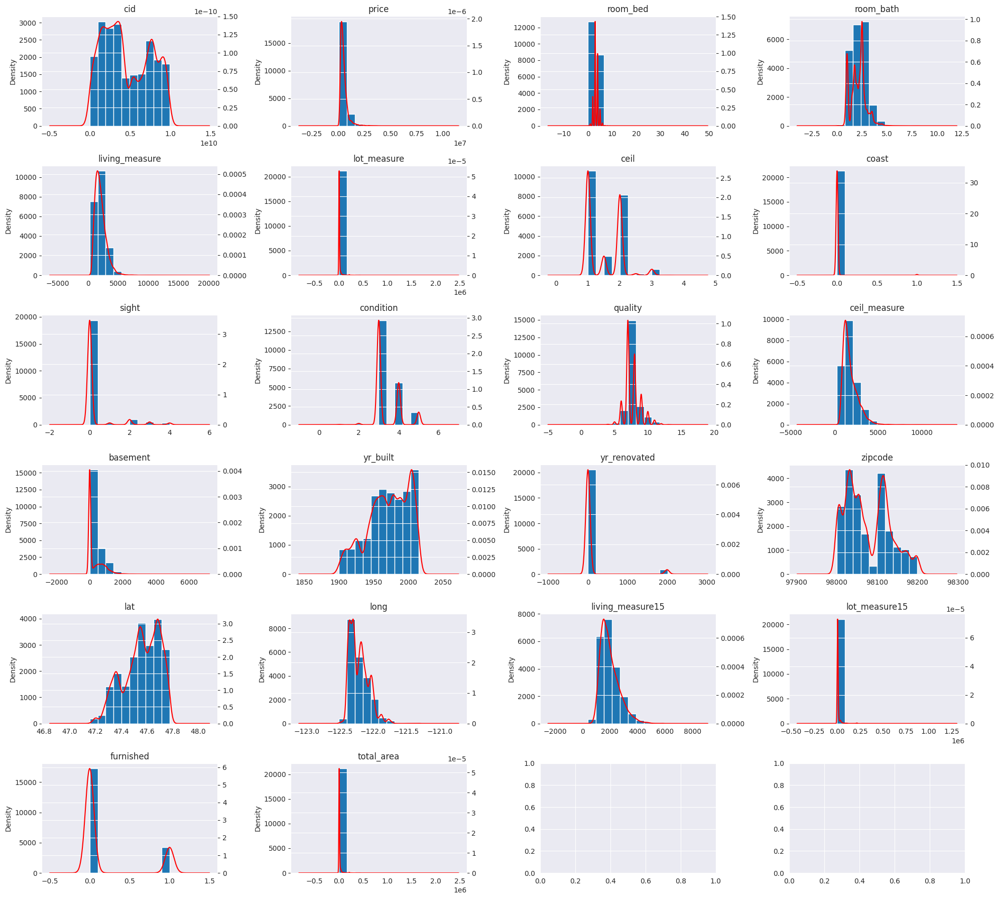

In [414]:
# Histograms & Heat Map
DsmlFunctions.getGeneralHistograms(data)

### Numerical Column Scatter Plot & Regression


Data Numerical Scatter Plot with Regression for column: price


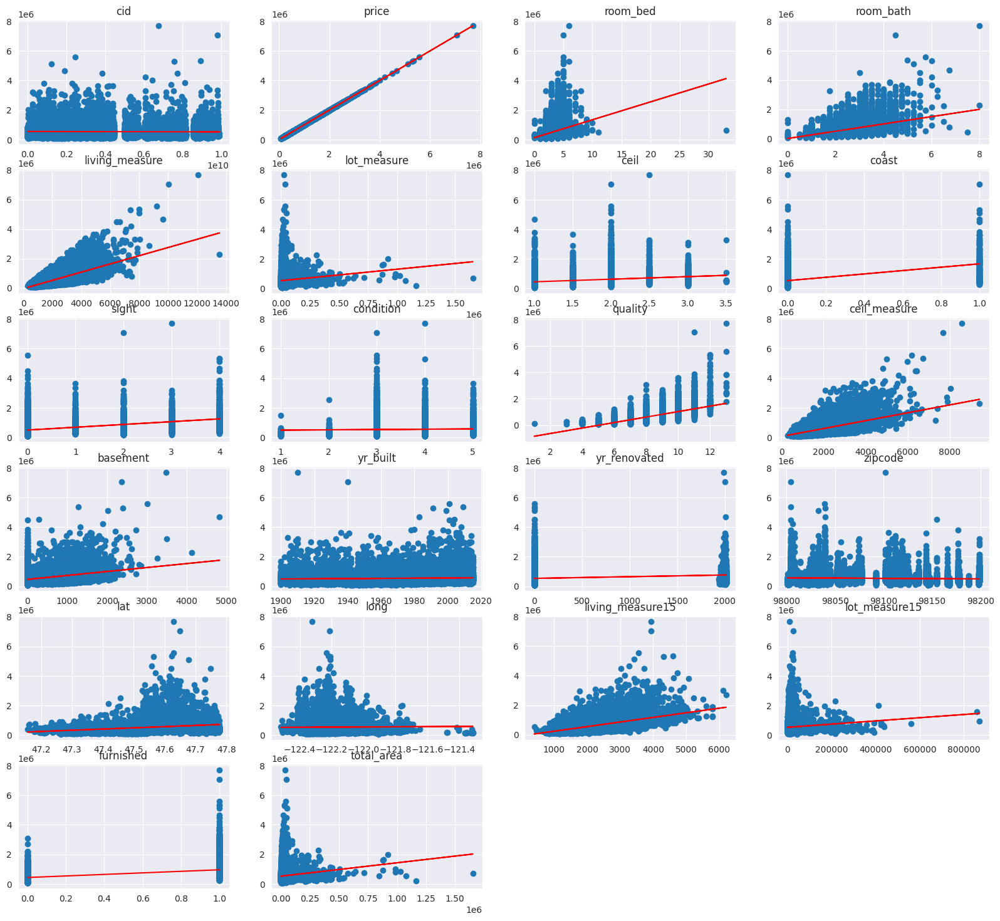

In [415]:
# Numerical Column Scatter Plot & Regression
DsmlFunctions.getGeneralGraphRegression(data, 'price')

### Heat Map


Data Heat Map


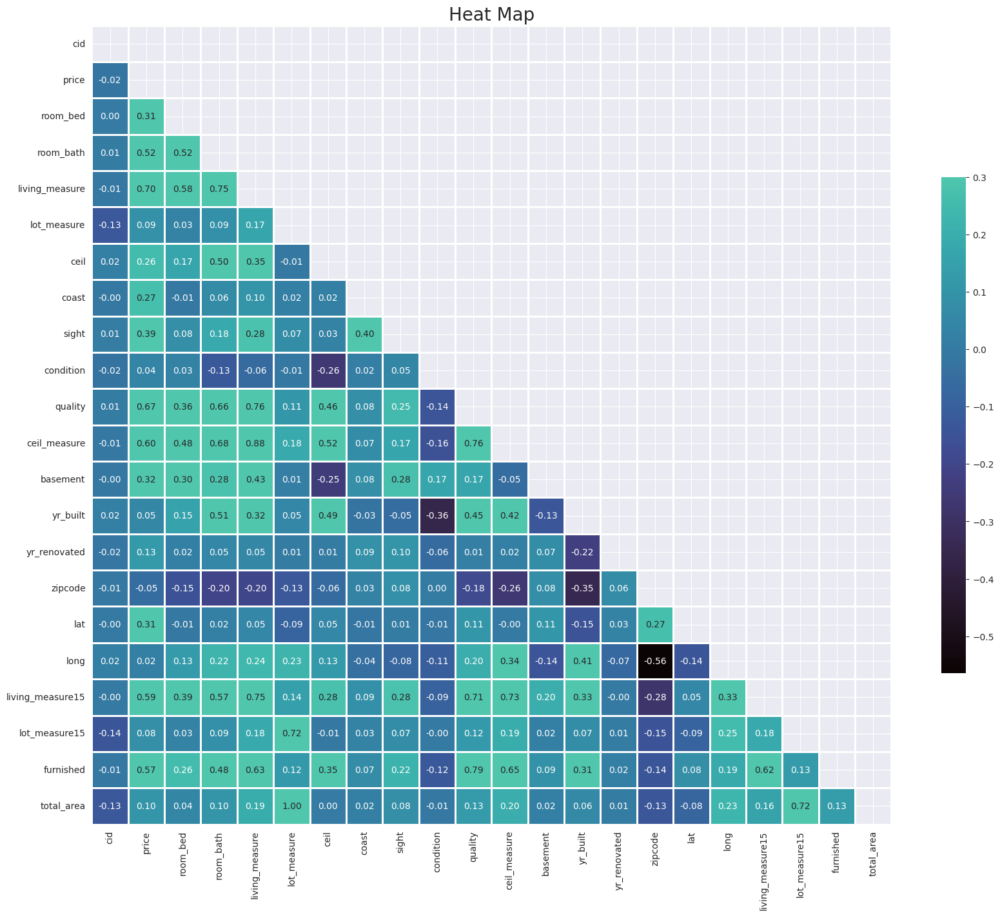

In [416]:
DsmlFunctions.getGeneralHeatMap(data)

### Handling Outliers
Let's visualize the boxplots first to get an idea of current values.


Data Numerical Box Plots


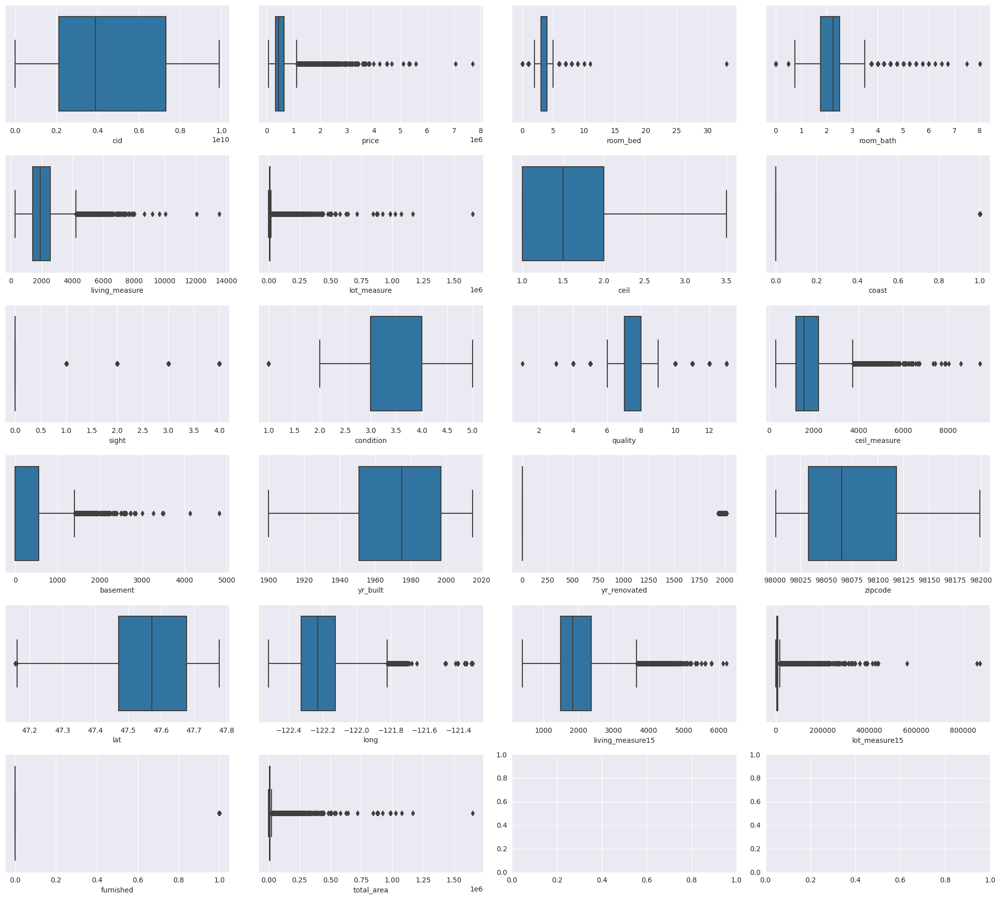

In [417]:
DsmlFunctions.getGeneralBoxPlots(data)


Box Plots and Skew


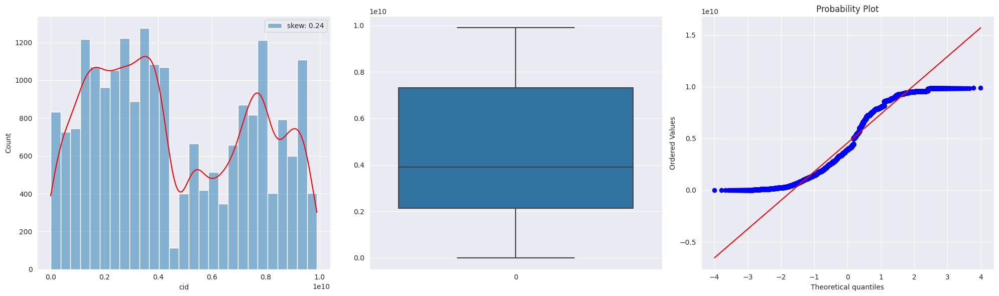

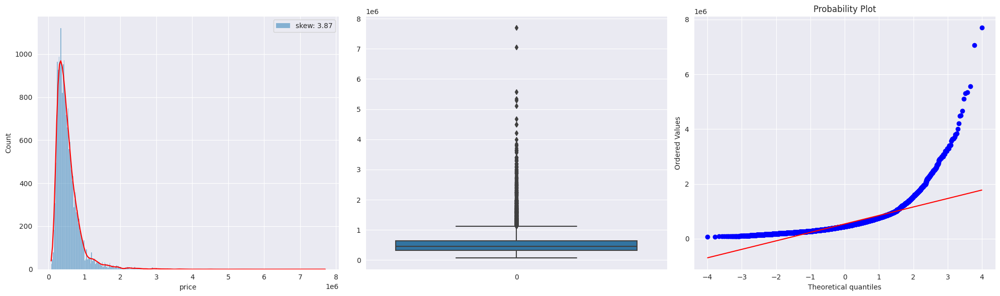

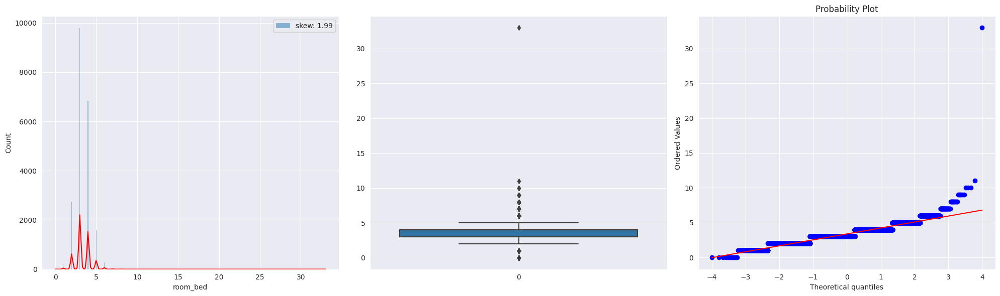

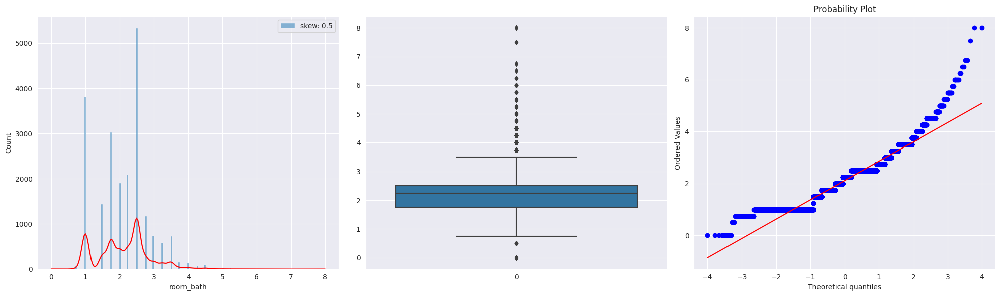

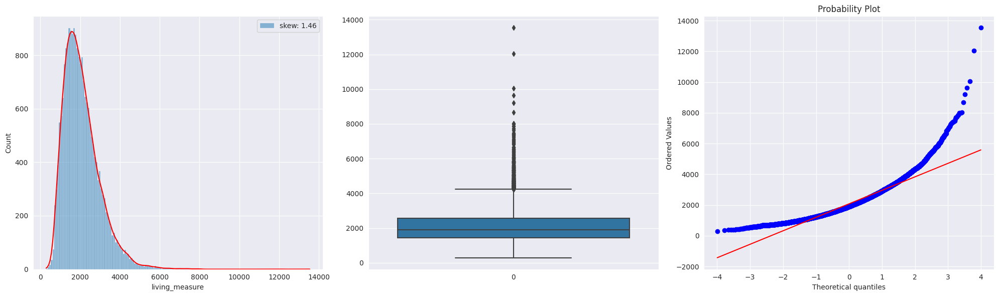

...

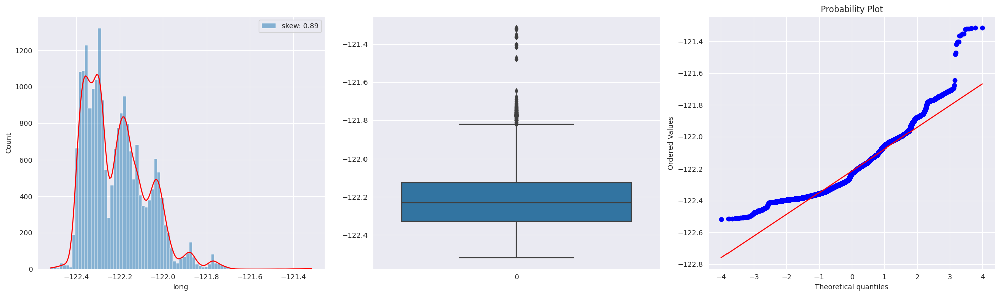

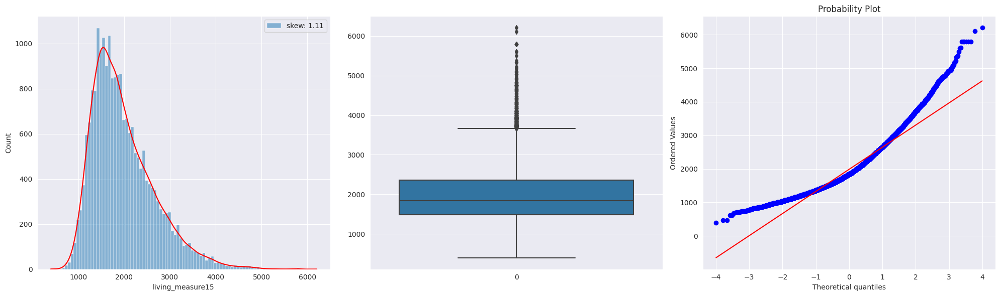

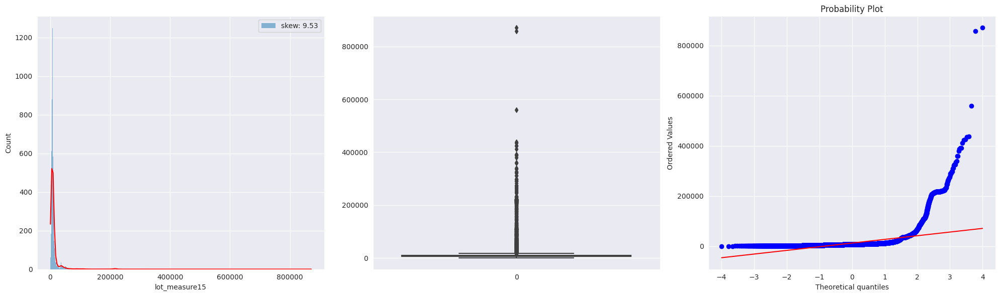

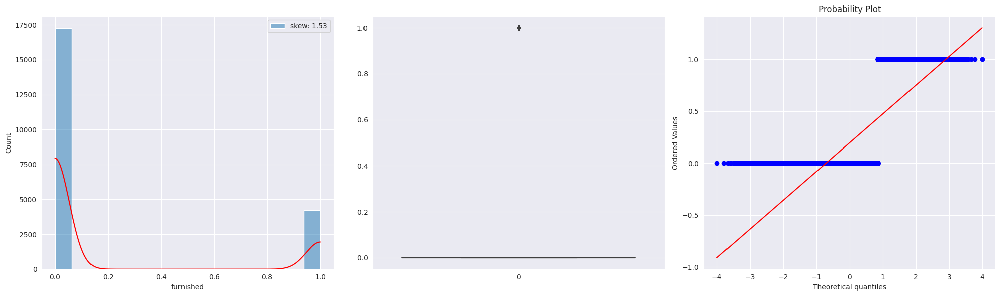

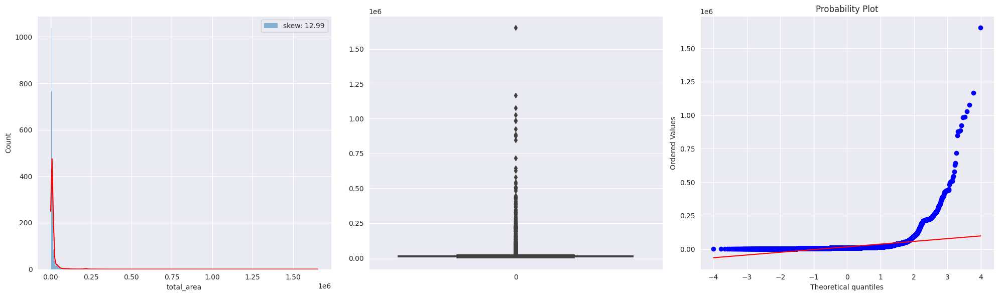

In [418]:
# Now let's review their skewness to know which Outlier method we should use (Z-score for Normal Distribution, otherwise IQR)

DsmlFunctions.getGeneralBoxPlotSkew(data)

- We can see almost none of the columns are Normally Distributed and are very skewed
- Therefore we will use the Inter-Quartile Range method to remove outliers instead of the Z-score method


Removing columns that are of Number type but are either 1/0, categorical, date or location


Removing Outliers with IQR factor of: 1.5


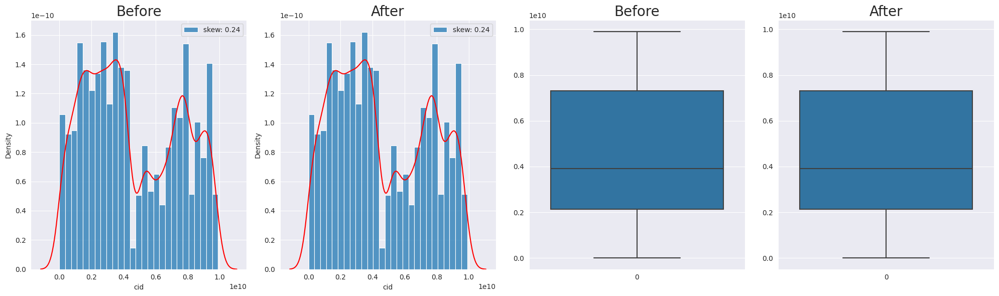

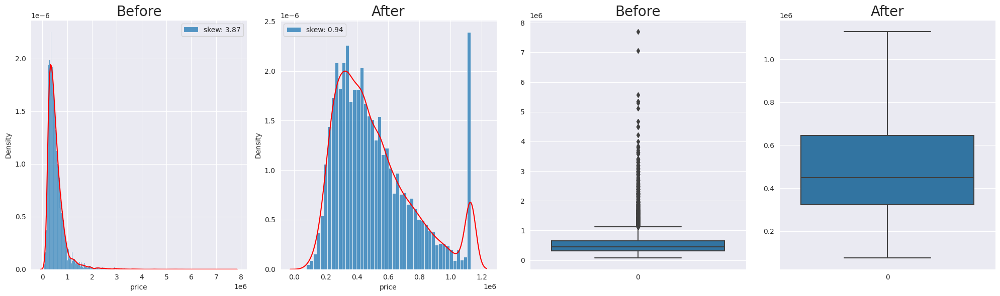

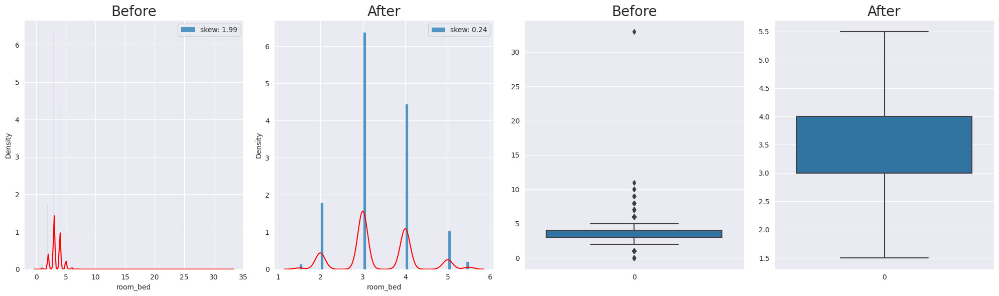

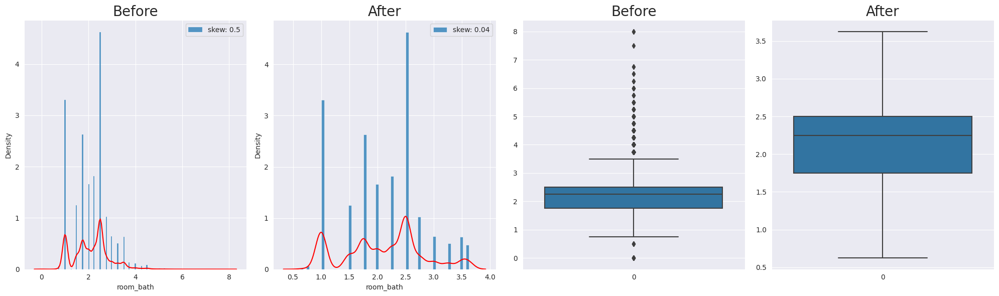

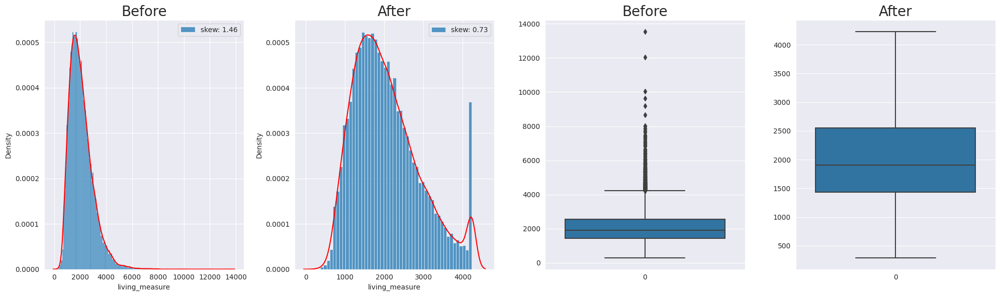

...

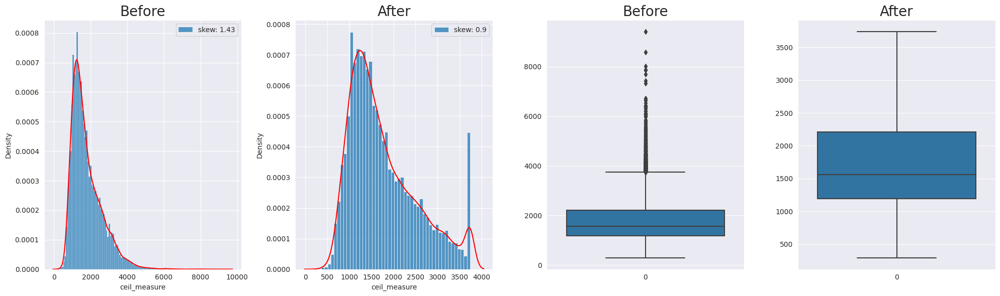

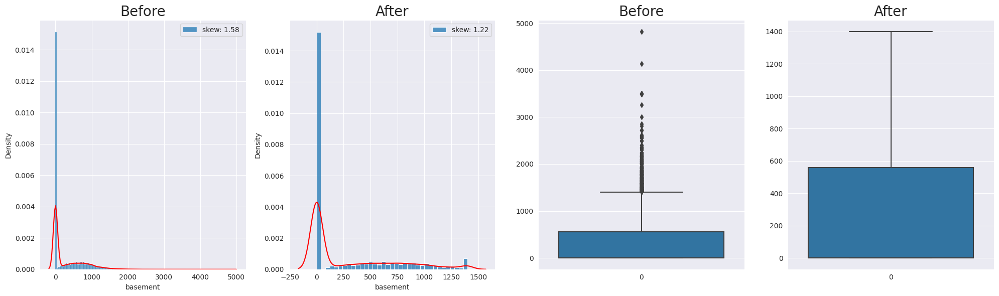

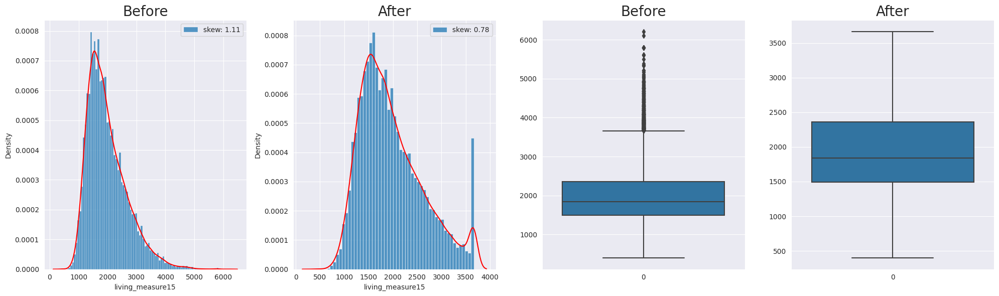

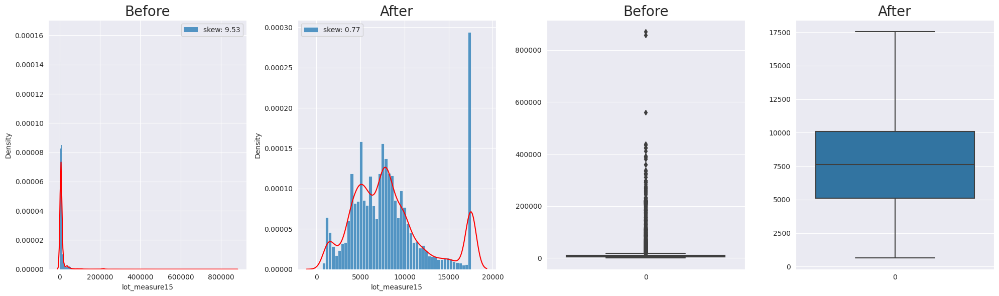

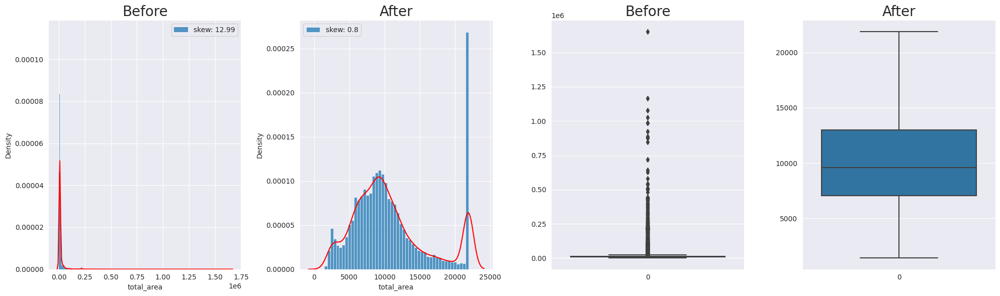

In [419]:
# Removing columns that are of Number type but are either 1/0, categorical, date or location

excluded_columns = ['furnished', 'coast', 'sight', 'condition', 'quality', 'yr_built', 'yr_renovated', 'lat', 'long', 'zipcode']
data = DsmlFunctions.getOutliersHandler(data, excluded_columns)

# Feature Engineering

## Fixing the Sell date column: dayhours

In [420]:
# Pass the date column name and text format it is in
data, dates = DsmlFunctions.getDateHandler(data_nonull, 'dayhours', '%Y%m%dT000000')

,cid,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,year,month,day
0,3876100940,600000,4.0,1.75,3050.0,9440.0,1.0,0.0,0.0,3.0,8.0,1800.0,1250.0,1966.0,0,98034,47.7228,-122.183,2020.0,8660.0,0.0,12490.0,2015,4,27
1,3145600250,190000,2.0,1.00,670.0,3101.0,1.0,0.0,0.0,4.0,6.0,670.0,0.0,1948.0,0,98118,47.5546,-122.274,1660.0,4100.0,0.0,3771.0,2015,3,17
2,7129303070,735000,4.0,2.75,3040.0,2415.0,2.0,1.0,4.0,3.0,8.0,3040.0,0.0,1966.0,0,98118,47.5188,-122.256,2620.0,2433.0,0.0,5455.0,2014,8,20
3,7338220280,257000,3.0,2.50,1740.0,3721.0,2.0,0.0,0.0,3.0,8.0,1740.0,0.0,2009.0,0,98002,47.3363,-122.213,2030.0,3794.0,0.0,5461.0,2014,10,10
4,7950300670,450000,2.0,1.00,1120.0,4590.0,1.0,0.0,0.0,3.0,7.0,1120.0,0.0,1924.0,0,98118,47.5663,-122.285,1120.0,5100.0,0.0,5710.0,2015,2,18


## Getting 4 Seasons of Sell date column: dayhours

In [421]:
data["sell_season"] = np.where(
    (data['month'] == 12) | (data['month'] == 1) | (data['month'] == 2), 'winter', np.where(
      (data['month'] == 3) | (data['month'] == 4) | (data['month'] == 5), 'spring', np.where(
        (data['month'] == 6) | (data['month'] == 7) | (data['month'] == 8), 'summer', np.where(
          (data['month'] == 9) | (data['month'] == 10) | (data['month'] == 11), 'autumn', ''
          )
        )
      )
    )

In [422]:
season_cols = ['month', 'sell_season']
data[season_cols].head()

,month,sell_season
0,4,spring
1,3,spring
2,8,summer
3,10,autumn
4,2,winter


## Property Age: under 10y, between 10-30y, between 30-50y, over 50y
These classifications could be related to property classes A, B, C, and D for older properties nearing 'antique' status.


In [423]:
today = datetime.date.today()
year = today.year
print(year)

data['property_age'] = np.where(
    ((year - data['yr_built']) < 10), 'under_10y', np.where(
        ((year - data['yr_built']) >= 10) & ((year - data['yr_built']) < 30), 'between_10y_30y', np.where(
            ((year - data['yr_built']) >= 30) & ((year - data['yr_built']) < 50), 'between_30y_50y', np.where(
                ((year - data['yr_built']) >= 50), 'over_50y', 'over_50y'
            )
        )
    )
)

data.head()

2023


,cid,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,year,month,day,sell_season,property_age
0,3876100940,600000,4.0,1.75,3050.0,9440.0,1.0,0.0,0.0,3.0,8.0,1800.0,1250.0,1966.0,0,98034,47.7228,-122.183,2020.0,8660.0,0.0,12490.0,2015,4,27,spring,over_50y
1,3145600250,190000,2.0,1.00,670.0,3101.0,1.0,0.0,0.0,4.0,6.0,670.0,0.0,1948.0,0,98118,47.5546,-122.274,1660.0,4100.0,0.0,3771.0,2015,3,17,spring,over_50y
2,7129303070,735000,4.0,2.75,3040.0,2415.0,2.0,1.0,4.0,3.0,8.0,3040.0,0.0,1966.0,0,98118,47.5188,-122.256,2620.0,2433.0,0.0,5455.0,2014,8,20,summer,over_50y
3,7338220280,257000,3.0,2.50,1740.0,3721.0,2.0,0.0,0.0,3.0,8.0,1740.0,0.0,2009.0,0,98002,47.3363,-122.213,2030.0,3794.0,0.0,5461.0,2014,10,10,autumn,between_10y_30y
4,7950300670,450000,2.0,1.00,1120.0,4590.0,1.0,0.0,0.0,3.0,7.0,1120.0,0.0,1924.0,0,98118,47.5663,-122.285,1120.0,5100.0,0.0,5710.0,2015,2,18,winter,over_50y


## Property Classes: Class A, Class B, Class C & Class D
- Class A: Under 10y, condition 5-3, otherwise Class B
- Class B: Between 10-30y, condition 5-3, otherwise Class C
- Class C: Between 30-50y, condition 5-2, otherwise Class D
- Class D: Over 50y, condition 5-1

https://realwealth.com/learn/classes-of-property-real-estate/

We'll create a single column that says which class it belongs to, and then separate that into Dummies

In [424]:
data["property_class"] = np.where(
    (data['property_age'] == 'under_10y') & (data['condition'] >= 3), 'class_A', np.where(
      (data['property_age'] == 'between_10y_30y') & (data['condition'] >= 3), 'class_B', np.where(
        (data['property_age'] == 'between_30y_50y') & (data['condition'] >= 2), 'class_C', np.where(
          (data['property_age'] == 'over_50y') & (data['condition'] >= 1), 'class_D', 'class_D'
          )
        )
      )
    )

In [425]:
class_cols = ['condition', 'property_age', 'property_class']
data[class_cols].head()

,condition,property_age,property_class
0,3.0,over_50y,class_D
1,4.0,over_50y,class_D
2,3.0,over_50y,class_D
3,3.0,between_10y_30y,class_B
4,3.0,over_50y,class_D


- We can see that properties of Class D significantly have the most sales amounts and a few highly prices properties.
  - Likely indicating older yet larger building complexes.
- Class B and C are mostly similar in both sales amount and price.
- Class A has the least sales amount indicating a shortage of newer properties.
  - Surprisingly, prices for Class A are the lowest, likely indicating smaller and newer individual home properties.

## Getting Zipcode specific info: Median Household Income & Median Home Value
Using the Python USZIPCODES package (https://uszipcode.readthedocs.io/index.html)

Which sources it data from: https://data.census.gov

- Median home value may not be representative of all buildings, but is a significant representation of income level and purchasing power for renters/consumers

### Home Value Tiers
(as per https://thebasispoint.com/whats-the-most-popular-home-price-bracket/)
- Property Tier 1: Under \$150k
- Property Tier 2: Between \$150k - \$199,999
- Property Tier 3: Between \$200k - \$299,999
- Property Tier 4: Between \$300k - \$399,999
- Property Tier 5: Between \$400k - \$499,999
- Property Tier 6: Between \$500k - \$749,999
- Property Tier 7: Between \$750k - \$999,999
- Property Tier 8: Over \$1M


Income Tiers: 

(as per IRS tax Stats: https://www.irs.gov/pub/irs-soi/20zpdoc.docx)

- Income Tier 1: Under \$25k
- Income Tier 2: Between \$25k - \$50k
- Income Tier 3: Between \$50k - \$75k
- Income Tier 4: Between \$75k - \$100k
- Income Tier 5: Between \$100k - \$200k
- Income Tier 6: Over \$200k



In [426]:
# Declare the zipcode SearchEngine
sr = SearchEngine()

median_household_income = []
median_home_value = []

for i, (name, val) in enumerate(data['zipcode'].iteritems()):
  zipcode = sr.by_zipcode(val)
  median_household_income.append(zipcode.median_household_income)
  median_home_value.append(zipcode.median_home_value)

data['median_household_income'] = median_household_income
data['median_home_value'] = median_home_value

Exception ignored in: <function SearchEngine.__del__ at 0x7f732529faf0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/dist-packages/uszipcode/search.py", line 196, in __del__
  File "/usr/local/lib/python3.9/dist-packages/uszipcode/search.py", line 202, in close
  File "/usr/local/lib/python3.9/dist-packages/sqlalchemy/orm/session.py", line 1813, in close
  File "/usr/local/lib/python3.9/dist-packages/sqlalchemy/orm/session.py", line 1855, in _close_impl
  File "/usr/local/lib/python3.9/dist-packages/sqlalchemy/orm/session.py", line 923, in close
  File "/usr/local/lib/python3.9/dist-packages/sqlalchemy/engine/base.py", line 2416, in close
  File "/usr/local/lib/python3.9/dist-packages/sqlalchemy/engine/base.py", line 2639, in _do_close
  File "/usr/local/lib/python3.9/dist-packages/sqlalchemy/engine/base.py", line 2625, in _close_impl
  File "/usr/local/lib/python3.9/dist-packages/sqlalchemy/engine/base.py", line 2617, in _connection_rollback_impl
  File "/usr/lo

In [427]:
zipcode_cols = ['zipcode','median_household_income', 'median_home_value']
data[zipcode_cols].head()

,zipcode,median_household_income,median_home_value
0,98034,77688,364900
1,98118,52276,350700
2,98118,52276,350700
3,98002,43568,167100
4,98118,52276,350700


Setting Categorical columns for Median Household Income and Median Home Value

In [428]:
# Setting categorical column for Property Tier

data["property_tier"] = np.where(
    (data['median_home_value'] < 150000), 'property_tier_1', np.where(
      ((data['median_home_value'] >= 150000) & (data['median_home_value'] < 200000)), 'property_tier_2', np.where(
        ((data['median_home_value'] >= 200000) & (data['median_home_value'] < 300000)), 'property_tier_3', np.where(
          ((data['median_home_value'] >= 300000) & (data['median_home_value'] < 400000)), 'property_tier_4', np.where(
            ((data['median_home_value'] >= 400000) & (data['median_home_value'] < 500000)), 'property_tier_5', np.where(
              ((data['median_home_value'] >= 500000) & (data['median_home_value'] < 750000)), 'property_tier_6', np.where(
                ((data['median_home_value'] >= 750000) & (data['median_home_value'] < 1000000)), 'property_tier_7', np.where(
                  (data['median_home_value'] >= 1000000), 'property_tier_8', 'property_tier_8'
                  )
                )
              )
            )
          )
        )
      )
    )

In [429]:
# Setting categorical column for Income Tier

data["income_tier"] = np.where(
    (data['median_household_income'] < 25000), 'income_tier_1', np.where(
      ((data['median_household_income'] >= 25000) & (data['median_household_income'] < 50000)), 'income_tier_2', np.where(
        ((data['median_household_income'] >= 50000) & (data['median_household_income'] < 75000)), 'income_tier_3', np.where(
          ((data['median_household_income'] >= 75000) & (data['median_household_income'] < 100000)), 'income_tier_4', np.where(
            ((data['median_household_income'] >= 100000) & (data['median_household_income'] < 200000)), 'income_tier_5', np.where(
              (data['median_household_income'] >= 200000), 'income_tier_6', 'income_tier_6'
              )
            )
          )
        )
      )
    )

In [430]:
zipcode_cols = ['zipcode', 'median_home_value', 'median_household_income', 'property_tier', 'income_tier']
data[zipcode_cols].head()

,zipcode,median_home_value,median_household_income,property_tier,income_tier
0,98034,364900,77688,property_tier_4,income_tier_4
1,98118,350700,52276,property_tier_4,income_tier_3
2,98118,350700,52276,property_tier_4,income_tier_3
3,98002,167100,43568,property_tier_2,income_tier_2
4,98118,350700,52276,property_tier_4,income_tier_3


### Graphs with Engineered Features

#### Prices vs Seasons

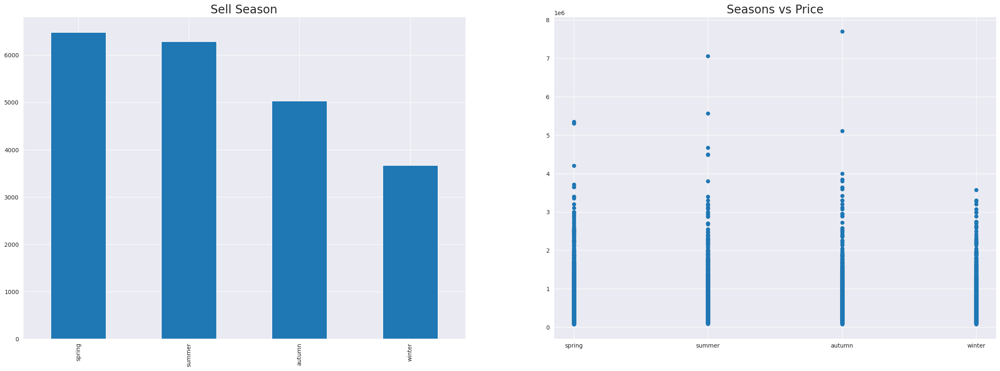

In [431]:
# lets look at Prices vs Seasons

fig = plt.figure(figsize=(30, 10))

plt.subplot(121)
data['sell_season'].value_counts().loc[['spring', 'summer', 'autumn', 'winter']].plot.bar()
plt.title('Sell Season', fontsize=20)

plt.subplot(122)
plt.scatter(data['sell_season'], data['price'])
plt.title('Seasons vs Price', fontsize=20)

plt.show()

#### Prices vs Property Classes

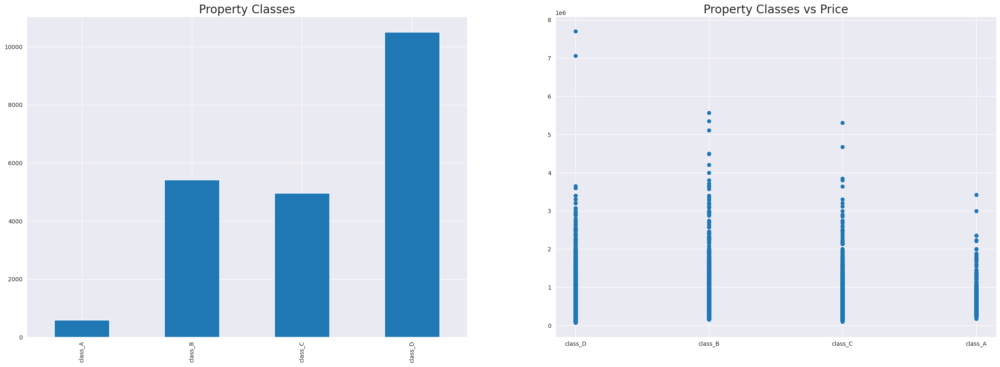

In [432]:
# lets look at Prices vs Property Classes

fig = plt.figure(figsize=(30, 10))

plt.subplot(121)
data['property_class'].value_counts().loc[['class_A', 'class_B', 'class_C', 'class_D']].plot.bar()
plt.title('Property Classes', fontsize=20)

plt.subplot(122)
plt.scatter(data['property_class'], data['price'])
plt.title('Property Classes vs Price', fontsize=20)

plt.show()

#### Prices vs Property Tier

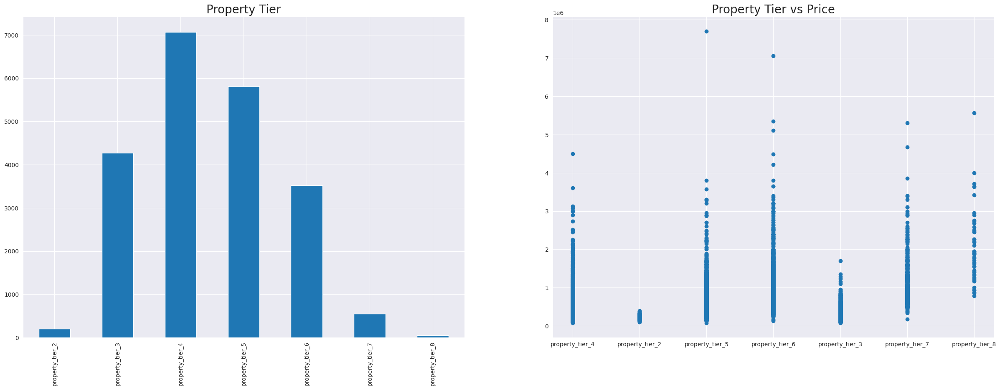

In [433]:
# lets look at Prices vs Property Tier

fig = plt.figure(figsize=(30, 10))

plt.subplot(121)
data['property_tier'].value_counts().loc[['property_tier_2', 'property_tier_3', 'property_tier_4', 'property_tier_5', 'property_tier_6', 'property_tier_7', 'property_tier_8']].plot.bar()
plt.title('Property Tier', fontsize=20)

plt.subplot(122)
plt.scatter(data['property_tier'], data['price'])
plt.title('Property Tier vs Price', fontsize=20)

plt.show()

#### Prices vs Income Tier

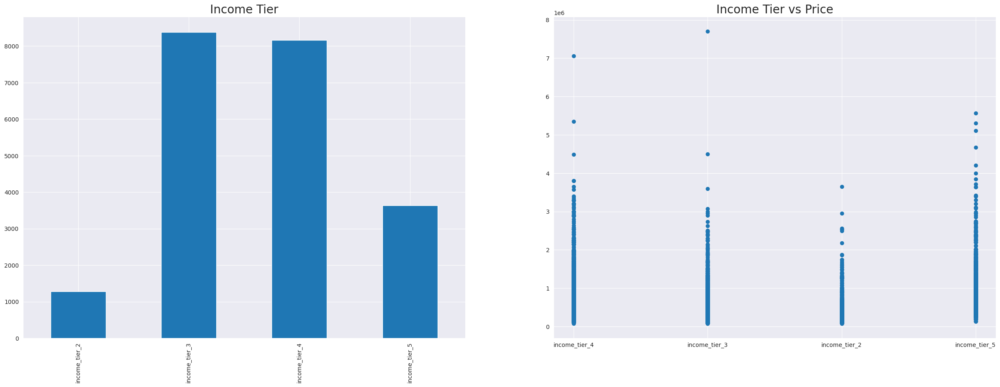

In [434]:
# lets look at Prices vs Income Tier

fig = plt.figure(figsize=(30, 10))

plt.subplot(121)
data['income_tier'].value_counts().loc[['income_tier_2', 'income_tier_3', 'income_tier_4', 'income_tier_5']].plot.bar()
plt.title('Income Tier', fontsize=20)

plt.subplot(122)
plt.scatter(data['income_tier'], data['price'])
plt.title('Income Tier vs Price', fontsize=20)

plt.show()

## Dummy Columns for Categorical Variables

### Columns: yr_renovated
Since it just contains the year last renovated, it can be one-hot encoded in place to Yes - 1/No - 0

In [435]:
data['yr_renovated'] = np.where(
    (data['yr_renovated'] > 0), 1, 0
)
data['yr_renovated'].unique()

array([0, 1])

### Columns: condition & quality

In [436]:
# By analyzing the data dictionary we can see the following columns could be categorical, lets explore them:
# 'condition', 'quality'
# Categorical values that are already hot-encoded with Yes/No: coast, furnished

data['condition'].unique()

array([3., 4., 5., 2., 1.])

In [437]:
data['condition'].value_counts()

3.0    13964
4.0     5625
5.0     1682
2.0      171
1.0       30
Name: condition, dtype: int64

In [438]:
# Replacing $ values with 4, since likely human error during entry by pressing shift+4 = $

data.loc[data['condition'].isin(['$']), 'condition'] = '4'

In [439]:
data['condition'].value_counts()

3.0    13964
4.0     5625
5.0     1682
2.0      171
1.0       30
Name: condition, dtype: int64

In [440]:
# Replacing values with categorical labels for Dummy Columns

data['condition'] = np.where(
    data['condition'] == 1.0, 'condition_1', np.where(
        data['condition'] == 2.0, 'condition_2', np.where(
            data['condition'] == 3.0, 'condition_3', np.where(
                data['condition'] == 4.0, 'condition_4', np.where(
                    data['condition'] == 5.0, 'condition_5', 'condition_5'
                )
            )
        )
    )
)
data['condition'].value_counts()

condition_3    13964
condition_4     5625
condition_5     1682
condition_2      171
condition_1       30
Name: condition, dtype: int64

In [441]:
dummies_condition = pd.get_dummies(data['condition'])
dummies_condition.head()

,condition_1,condition_2,condition_3,condition_4,condition_5
0,0,0,1,0,0
1,0,0,0,1,0
2,0,0,1,0,0
3,0,0,1,0,0
4,0,0,1,0,0


In [442]:
# Quality column

data['quality'].unique()

array([ 8.,  6.,  7., 10.,  9.,  5., 11., 13.,  4., 12.,  1.,  3.])

In [443]:
data['quality'].value_counts()

7.0     8918
8.0     6026
9.0     2600
6.0     2026
10.0    1130
11.0     396
5.0      241
12.0      90
4.0       29
13.0      12
3.0        3
1.0        1
Name: quality, dtype: int64

In [444]:
# Replacing values with categorical labels for Dummy Columns

data['quality'] = np.where(
    data['quality'] == 1.0, 'quality_01', np.where(
        data['quality'] == 2.0, 'quality_02', np.where(
            data['quality'] == 3.0, 'quality_03', np.where(
                data['quality'] == 4.0, 'quality_04', np.where(
                    data['quality'] == 5.0, 'quality_05', np.where(
                        data['quality'] == 6.0, 'quality_06', np.where(
                            data['quality'] == 7.0, 'quality_07', np.where(
                                data['quality'] == 8.0, 'quality_08', np.where(
                                    data['quality'] == 9.0, 'quality_09', np.where(
                                        data['quality'] == 10.0, 'quality_10', np.where(
                                            data['quality'] == 11.0, 'quality_11', np.where(
                                                data['quality'] == 12.0, 'quality_12', np.where(
                                                    data['quality'] == 13.0, 'quality_13', 'quality_13'
                                                )
                                            )
                                        )
                                    )
                                )
                            )
                        )
                    )
                )
            )
        )
    )
)
data['quality'].value_counts()

quality_07    8918
quality_08    6026
quality_09    2600
quality_06    2026
quality_10    1130
quality_11     396
quality_05     241
quality_12      90
quality_04      29
quality_13      12
quality_03       3
quality_01       1
Name: quality, dtype: int64

In [445]:
dummies_quality = pd.get_dummies(data['quality'])
dummies_quality.head()

,quality_01,quality_03,quality_04,quality_05,quality_06,quality_07,quality_08,quality_09,quality_10,quality_11,quality_12,quality_13
0,0,0,0,0,0,0,1,0,0,0,0,0
1,0,0,0,0,1,0,0,0,0,0,0,0
2,0,0,0,0,0,0,1,0,0,0,0,0
3,0,0,0,0,0,0,1,0,0,0,0,0
4,0,0,0,0,0,1,0,0,0,0,0,0


### Dummy columns for engineered columns: sell_season, property_age, property_class, property_tier, income_tier

In [446]:
dummies_sell_season = pd.get_dummies(data['sell_season'])
dummies_sell_season.head()

,autumn,spring,summer,winter
0,0,1,0,0
1,0,1,0,0
2,0,0,1,0
3,1,0,0,0
4,0,0,0,1


In [447]:
dummies_property_age = pd.get_dummies(data['property_age'])
dummies_property_age.head()

,between_10y_30y,between_30y_50y,over_50y,under_10y
0,0,0,1,0
1,0,0,1,0
2,0,0,1,0
3,1,0,0,0
4,0,0,1,0


In [448]:
dummies_property_class = pd.get_dummies(data['property_class'])
dummies_property_class.head()

,class_A,class_B,class_C,class_D
0,0,0,0,1
1,0,0,0,1
2,0,0,0,1
3,0,1,0,0
4,0,0,0,1


In [449]:
dummies_property_tier = pd.get_dummies(data['property_tier'])
dummies_property_tier.head()

,property_tier_2,property_tier_3,property_tier_4,property_tier_5,property_tier_6,property_tier_7,property_tier_8
0,0,0,1,0,0,0,0
1,0,0,1,0,0,0,0
2,0,0,1,0,0,0,0
3,1,0,0,0,0,0,0
4,0,0,1,0,0,0,0


In [450]:
dummies_income_tier = pd.get_dummies(data['income_tier'])
dummies_income_tier.head()

,income_tier_2,income_tier_3,income_tier_4,income_tier_5
0,0,0,1,0
1,0,1,0,0
2,0,1,0,0
3,1,0,0,0
4,0,1,0,0


### Adding Dummy columns to new Dataframe and removing object categorical columns

In [451]:
data_dummies = pd.concat([data, dummies_condition, dummies_quality, dummies_sell_season, dummies_property_age, dummies_property_class, dummies_property_tier, dummies_income_tier], axis=1)
data_dummies.head()

,cid,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,year,month,day,sell_season,property_age,property_class,median_household_income,median_home_value,property_tier,income_tier,condition_1,condition_2,condition_3,condition_4,condition_5,quality_01,quality_03,quality_04,quality_05,quality_06,quality_07,quality_08,quality_09,quality_10,quality_11,quality_12,quality_13,autumn,spring,summer,winter,between_10y_30y,between_30y_50y,over_50y,under_10y,class_A,class_B,class_C,class_D,property_tier_2,property_tier_3,property_tier_4,property_tier_5,property_tier_6,property_tier_7,property_tier_8,income_tier_2,income_tier_3,income_tier_4,income_tier_5
0,3876100940,600000,4.0,1.75,3050.0,9440.0,1.0,0.0,0.0,condition_3,quality_08,1800.0,1250.0,1966.0,0,98034,47.7228,-122.183,2020.0,8660.0,0.0,12490.0,2015,4,27,spring,over_50y,class_D,77688,364900,property_tier_4,income_tier_4,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0
1,3145600250,190000,2.0,1.00,670.0,3101.0,1.0,0.0,0.0,condition_4,quality_06,670.0,0.0,1948.0,0,98118,47.5546,-122.274,1660.0,4100.0,0.0,3771.0,2015,3,17,spring,over_50y,class_D,52276,350700,property_tier_4,income_tier_3,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0
2,7129303070,735000,4.0,2.75,3040.0,2415.0,2.0,1.0,4.0,condition_3,quality_08,3040.0,0.0,1966.0,0,98118,47.5188,-122.256,2620.0,2433.0,0.0,5455.0,2014,8,20,summer,over_50y,class_D,52276,350700,property_tier_4,income_tier_3,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0
3,7338220280,257000,3.0,2.50,1740.0,3721.0,2.0,0.0,0.0,condition_3,quality_08,1740.0,0.0,2009.0,0,98002,47.3363,-122.213,2030.0,3794.0,0.0,5461.0,2014,10,10,autumn,between_10y_30y,class_B,43568,167100,property_tier_2,income_tier_2,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0
4,7950300670,450000,2.0,1.00,1120.0,4590.0,1.0,0.0,0.0,condition_3,quality_07,1120.0,0.0,1924.0,0,98118,47.5663,-122.285,1120.0,5100.0,0.0,5710.0,2015,2,18,winter,over_50y,class_D,52276,350700,property_tier_4,income_tier_3,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0


The column yr_renovated has a year value which can be hot-encoded as 0 - not renovated, 1 - renovated

In [452]:
data_dummies['yr_renovated'] = np.where(
    data_dummies['yr_renovated'] != 0, 1, 0
)
data_dummies['yr_renovated'].unique()

array([0, 1])

In [453]:
data_dummies_cat_cols = data.select_dtypes(exclude=["number"])
data_dummies.drop(data_dummies_cat_cols, axis=1, inplace=True)

In [454]:
data_dummies.head()

,cid,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,year,month,day,median_household_income,median_home_value,condition_1,condition_2,condition_3,condition_4,condition_5,quality_01,quality_03,quality_04,quality_05,quality_06,quality_07,quality_08,quality_09,quality_10,quality_11,quality_12,quality_13,autumn,spring,summer,winter,between_10y_30y,between_30y_50y,over_50y,under_10y,class_A,class_B,class_C,class_D,property_tier_2,property_tier_3,property_tier_4,property_tier_5,property_tier_6,property_tier_7,property_tier_8,income_tier_2,income_tier_3,income_tier_4,income_tier_5
0,3876100940,600000,4.0,1.75,3050.0,9440.0,1.0,0.0,0.0,1800.0,1250.0,1966.0,0,98034,47.7228,-122.183,2020.0,8660.0,0.0,12490.0,2015,4,27,77688,364900,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0
1,3145600250,190000,2.0,1.00,670.0,3101.0,1.0,0.0,0.0,670.0,0.0,1948.0,0,98118,47.5546,-122.274,1660.0,4100.0,0.0,3771.0,2015,3,17,52276,350700,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0
2,7129303070,735000,4.0,2.75,3040.0,2415.0,2.0,1.0,4.0,3040.0,0.0,1966.0,0,98118,47.5188,-122.256,2620.0,2433.0,0.0,5455.0,2014,8,20,52276,350700,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0
3,7338220280,257000,3.0,2.50,1740.0,3721.0,2.0,0.0,0.0,1740.0,0.0,2009.0,0,98002,47.3363,-122.213,2030.0,3794.0,0.0,5461.0,2014,10,10,43568,167100,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0
4,7950300670,450000,2.0,1.00,1120.0,4590.0,1.0,0.0,0.0,1120.0,0.0,1924.0,0,98118,47.5663,-122.285,1120.0,5100.0,0.0,5710.0,2015,2,18,52276,350700,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0


In [455]:
# Creating a backup for faster testing at re split of X_train, X_test

data_dummies_testing_reset = data_dummies

### Deleting unecessary variables/dataframes to clear up RAM: 

dummies_condition, dummies_quality, dummies_sell_season, dummies_property_age, dummies_property_class, dummies_property_tier, dummies_income_tier

In [456]:
# del dummies_condition, dummies_quality, dummies_sell_season, dummies_property_age, dummies_property_class, dummies_property_tier, dummies_income_tier
# del data_dummies_scaled

### Heat Map with Engineered Features (Dummy Columns)


Data Heat Map


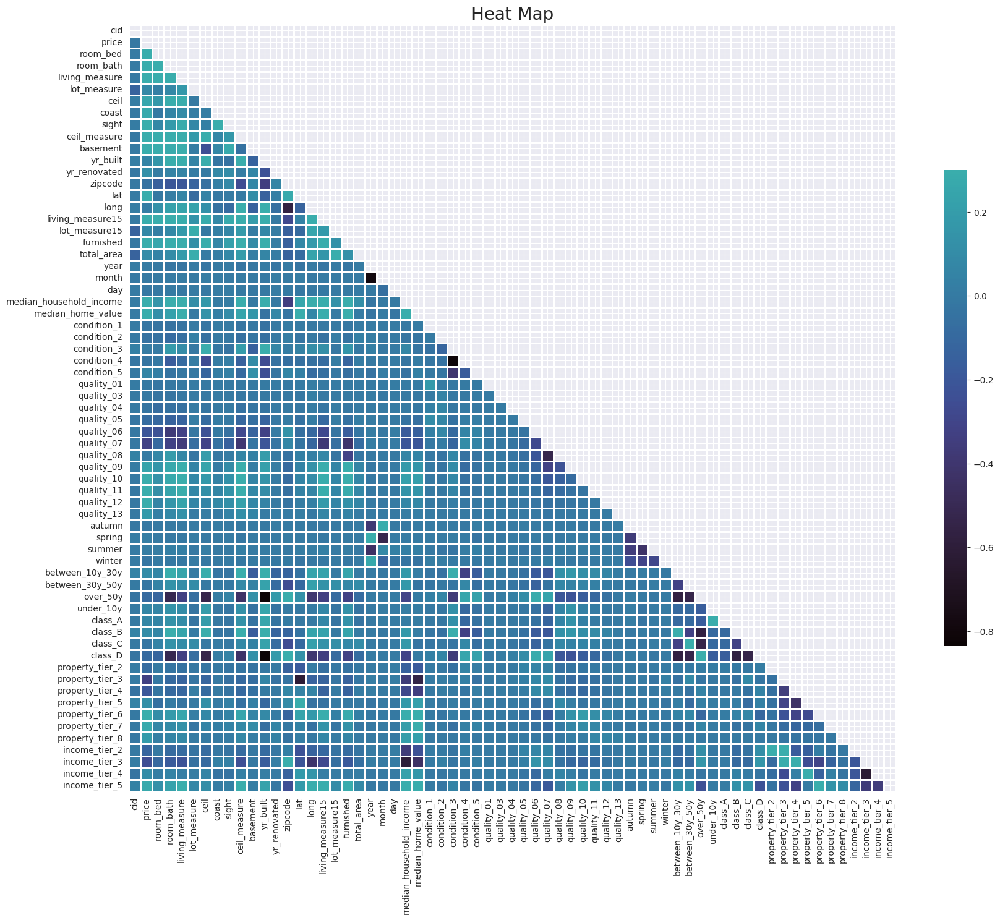

In [457]:
DsmlFunctions.getGeneralHeatMap(data_dummies, False)

## Clustering: KMeans


### Categorical features (Post Dummy Columns)
Need to scale/normalize data *after* removing outliers

In [458]:
scaler = StandardScaler()

data_dummies_scaled = scaler.fit_transform(data_dummies)

data_dummies_scaled = pd.DataFrame(data_dummies_scaled)

data_dummies_scaled.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64
0,-0.244469,0.164533,0.678350,-0.475349,1.057783,-0.136682,-0.916644,-0.086646,-0.305208,0.013629,2.166552,-0.170378,-0.209768,-0.821162,1.174725,0.219085,0.049274,-0.150443,-0.494799,-0.112885,1.448127,-0.826505,1.311298,-0.141221,-0.359166,-0.037405,-0.089598,0.733259,-0.595782,-0.291535,-0.006825,-0.011821,-0.036775,-0.106543,-0.322778,-0.842835,1.601008,-0.371174,-0.235691,-0.137073,-0.064878,-0.023647,-0.553247,1.520206,-0.643305,-0.454045,-0.581007,-0.547573,1.021753,-0.16882,-0.16882,-0.580935,-0.547573,1.021658,-0.096473,-0.498442,1.427556,-0.609497,-0.442807,-0.161833,-0.047825,-0.252195,-0.800445,1.276243,-0.451431
1,-0.498469,-0.958584,-1.475200,-1.451972,-1.537435,-0.289792,-0.916644,-0.086646,-0.305208,-1.352240,-0.658457,-0.782872,-0.209768,0.748412,-0.039179,-0.426811,-0.477317,-0.317431,-0.494799,-0.322565,1.448127,-1.147660,0.153174,-1.191192,-0.466154,-0.037405,-0.089598,-1.363775,1.678465,-0.291535,-0.006825,-0.011821,-0.036775,-0.106543,3.098100,-0.842835,-0.624607,-0.371174,-0.235691,-0.137073,-0.064878,-0.023647,-0.553247,1.520206,-0.643305,-0.454045,-0.581007,-0.547573,1.021753,-0.16882,-0.16882,-0.580935,-0.547573,1.021658,-0.096473,-0.498442,1.427556,-0.609497,-0.442807,-0.161833,-0.047825,-0.252195,1.249305,-0.783550,-0.451431
2,0.886693,0.534340,0.678350,0.826816,1.046878,-0.306361,0.936668,11.541230,4.927074,1.512459,-0.658457,-0.170378,-0.209768,0.748412,-0.297548,-0.299051,0.926925,-0.378477,-0.494799,-0.282067,-0.690547,0.458116,0.500611,-1.191192,-0.466154,-0.037405,-0.089598,0.733259,-0.595782,-0.291535,-0.006825,-0.011821,-0.036775,-0.106543,-0.322778,-0.842835,1.601008,-0.371174,-0.235691,-0.137073,-0.064878,-0.023647,-0.553247,-0.657806,1.554474,-0.454045,-0.581007,-0.547573,1.021753,-0.16882,-0.16882,-0.580935,-0.547573,1.021658,-0.096473,-0.498442,1.427556,-0.609497,-0.442807,-0.161833,-0.047825,-0.252195,1.249305,-0.783550,-0.451431
3,0.959335,-0.775050,-0.398425,0.501275,-0.370677,-0.274817,0.936668,-0.086646,-0.305208,-0.058895,-0.658457,1.292802,-0.209768,-1.419095,-1.614656,0.006152,0.063901,-0.328637,-0.494799,-0.281923,-0.690547,1.100426,-0.657512,-1.550989,-1.849463,-0.037405,-0.089598,0.733259,-0.595782,-0.291535,-0.006825,-0.011821,-0.036775,-0.106543,-0.322778,-0.842835,1.601008,-0.371174,-0.235691,-0.137073,-0.064878,-0.023647,1.807510,-0.657806,-0.643305,-0.454045,1.721149,-0.547573,-0.978710,-0.16882,-0.16882,1.721362,-0.547573,-0.978801,10.365541,-0.498442,-0.700498,-0.609497,-0.442807,-0.161833,-0.047825,3.965191,-0.800445,-0.783550,-0.451431
4,1.172160,-0.246363,-1.475200,-1.451972,-1.046742,-0.253827,-0.916644,-0.086646,-0.305208,-0.808310,-0.658457,-1.599531,-0.209768,0.748412,0.045260,-0.504886,-1.267204,-0.280811,-0.494799,-0.275935,1.448127,-1.468815,0.268987,-1.191192,-0.466154,-0.037405,-0.089598,0.733259,-0.595782,-0.291535,-0.006825,-0.011821,-0.036775,-0.106543,-0.322778,1.186472,-0.624607,-0.371174,-0.235691,-0.137073,-0.064878,-0.023647,-0.553247,-0.657806,-0.643305,2.202426,-0.581007,-0.547573,1.021753,-0.16882,-0.16882,-0.580935,-0.547573,1.021658,-0.096473,-0.498442,1.427556,-0.609497,-0.442807,-0.161833,-0.047825,-0.252195,1.249305,-0.783550,-0.451431



K-Means Curve


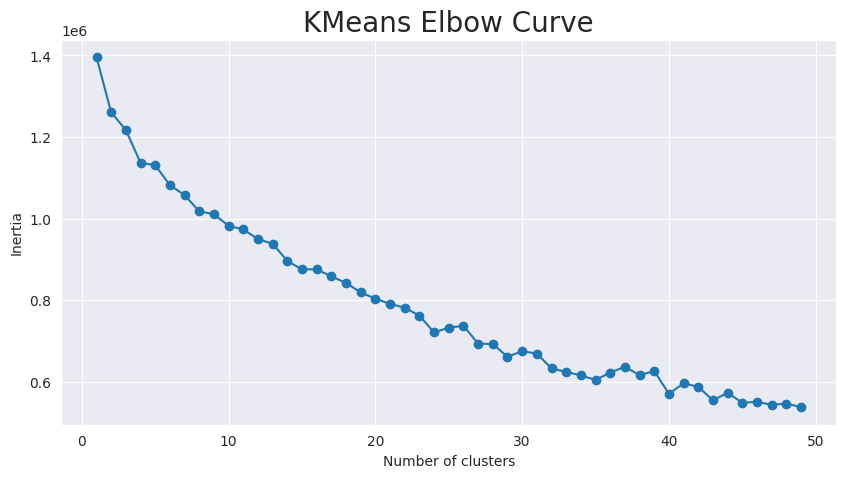

In [459]:
DsmlFunctions.getKMeansCurve(data_dummies_scaled, 50)

We will choose 4 as the number of clusters for the following reasons:
- It is the number where the curve first stops
- It matches the number of Property Classes
- It is small enough selection that we can work with.


In [460]:
data_dummies_kmeans = DsmlFunctions.getKMeansLabels(data_dummies_scaled, 4)
data_dummies_kmeans.head()


K-Means Labels


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,k_means_labels
0,-0.244469,0.164533,0.678350,-0.475349,1.057783,-0.136682,-0.916644,-0.086646,-0.305208,0.013629,2.166552,-0.170378,-0.209768,-0.821162,1.174725,0.219085,0.049274,-0.150443,-0.494799,-0.112885,1.448127,-0.826505,1.311298,-0.141221,-0.359166,-0.037405,-0.089598,0.733259,-0.595782,-0.291535,-0.006825,-0.011821,-0.036775,-0.106543,-0.322778,-0.842835,1.601008,-0.371174,-0.235691,-0.137073,-0.064878,-0.023647,-0.553247,1.520206,-0.643305,-0.454045,-0.581007,-0.547573,1.021753,-0.16882,-0.16882,-0.580935,-0.547573,1.021658,-0.096473,-0.498442,1.427556,-0.609497,-0.442807,-0.161833,-0.047825,-0.252195,-0.800445,1.276243,-0.451431,1
1,-0.498469,-0.958584,-1.475200,-1.451972,-1.537435,-0.289792,-0.916644,-0.086646,-0.305208,-1.352240,-0.658457,-0.782872,-0.209768,0.748412,-0.039179,-0.426811,-0.477317,-0.317431,-0.494799,-0.322565,1.448127,-1.147660,0.153174,-1.191192,-0.466154,-0.037405,-0.089598,-1.363775,1.678465,-0.291535,-0.006825,-0.011821,-0.036775,-0.106543,3.098100,-0.842835,-0.624607,-0.371174,-0.235691,-0.137073,-0.064878,-0.023647,-0.553247,1.520206,-0.643305,-0.454045,-0.581007,-0.547573,1.021753,-0.16882,-0.16882,-0.580935,-0.547573,1.021658,-0.096473,-0.498442,1.427556,-0.609497,-0.442807,-0.161833,-0.047825,-0.252195,1.249305,-0.783550,-0.451431,1
2,0.886693,0.534340,0.678350,0.826816,1.046878,-0.306361,0.936668,11.541230,4.927074,1.512459,-0.658457,-0.170378,-0.209768,0.748412,-0.297548,-0.299051,0.926925,-0.378477,-0.494799,-0.282067,-0.690547,0.458116,0.500611,-1.191192,-0.466154,-0.037405,-0.089598,0.733259,-0.595782,-0.291535,-0.006825,-0.011821,-0.036775,-0.106543,-0.322778,-0.842835,1.601008,-0.371174,-0.235691,-0.137073,-0.064878,-0.023647,-0.553247,-0.657806,1.554474,-0.454045,-0.581007,-0.547573,1.021753,-0.16882,-0.16882,-0.580935,-0.547573,1.021658,-0.096473,-0.498442,1.427556,-0.609497,-0.442807,-0.161833,-0.047825,-0.252195,1.249305,-0.783550,-0.451431,1
3,0.959335,-0.775050,-0.398425,0.501275,-0.370677,-0.274817,0.936668,-0.086646,-0.305208,-0.058895,-0.658457,1.292802,-0.209768,-1.419095,-1.614656,0.006152,0.063901,-0.328637,-0.494799,-0.281923,-0.690547,1.100426,-0.657512,-1.550989,-1.849463,-0.037405,-0.089598,0.733259,-0.595782,-0.291535,-0.006825,-0.011821,-0.036775,-0.106543,-0.322778,-0.842835,1.601008,-0.371174,-0.235691,-0.137073,-0.064878,-0.023647,1.807510,-0.657806,-0.643305,-0.454045,1.721149,-0.547573,-0.978710,-0.16882,-0.16882,1.721362,-0.547573,-0.978801,10.365541,-0.498442,-0.700498,-0.609497,-0.442807,-0.161833,-0.047825,3.965191,-0.800445,-0.783550,-0.451431,0
4,1.172160,-0.246363,-1.475200,-1.451972,-1.046742,-0.253827,-0.916644,-0.086646,-0.305208,-0.808310,-0.658457,-1.599531,-0.209768,0.748412,0.045260,-0.504886,-1.267204,-0.280811,-0.494799,-0.275935,1.448127,-1.468815,0.268987,-1.191192,-0.466154,-0.037405,-0.089598,0.733259,-0.595782,-0.291535,-0.006825,-0.011821,-0.036775,-0.106543,-0.322778,1.186472,-0.624607,-0.371174,-0.235691,-0.137073,-0.064878,-0.023647,-0.553247,-0.657806,-0.643305,2.202426,-0.581007,-0.547573,1.021753,-0.16882,-0.16882,-0.580935,-0.547573,1.021658,-0.096473,-0.498442,1.427556,-0.609497,-0.442807,-0.161833,-0.047825,-0.252195,1.249305,-0.783550,-0.451431,1


In [461]:
data_dummies['k_means_labels'] = data_dummies_kmeans['k_means_labels']
data_dummies.head()

,cid,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,year,month,day,median_household_income,median_home_value,condition_1,condition_2,condition_3,condition_4,condition_5,quality_01,quality_03,quality_04,quality_05,quality_06,quality_07,quality_08,quality_09,quality_10,quality_11,quality_12,quality_13,autumn,spring,summer,winter,between_10y_30y,between_30y_50y,over_50y,under_10y,class_A,class_B,class_C,class_D,property_tier_2,property_tier_3,property_tier_4,property_tier_5,property_tier_6,property_tier_7,property_tier_8,income_tier_2,income_tier_3,income_tier_4,income_tier_5,k_means_labels
0,3876100940,600000,4.0,1.75,3050.0,9440.0,1.0,0.0,0.0,1800.0,1250.0,1966.0,0,98034,47.7228,-122.183,2020.0,8660.0,0.0,12490.0,2015,4,27,77688,364900,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,1.0
1,3145600250,190000,2.0,1.00,670.0,3101.0,1.0,0.0,0.0,670.0,0.0,1948.0,0,98118,47.5546,-122.274,1660.0,4100.0,0.0,3771.0,2015,3,17,52276,350700,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1.0
2,7129303070,735000,4.0,2.75,3040.0,2415.0,2.0,1.0,4.0,3040.0,0.0,1966.0,0,98118,47.5188,-122.256,2620.0,2433.0,0.0,5455.0,2014,8,20,52276,350700,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1.0
3,7338220280,257000,3.0,2.50,1740.0,3721.0,2.0,0.0,0.0,1740.0,0.0,2009.0,0,98002,47.3363,-122.213,2030.0,3794.0,0.0,5461.0,2014,10,10,43568,167100,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0.0
4,7950300670,450000,2.0,1.00,1120.0,4590.0,1.0,0.0,0.0,1120.0,0.0,1924.0,0,98118,47.5663,-122.285,1120.0,5100.0,0.0,5710.0,2015,2,18,52276,350700,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1.0


### Plotting Longitude and Latitude grouped by labels: KMeans, Property Class, Property Tier, Income Tier 


Grouped Scatter Plot


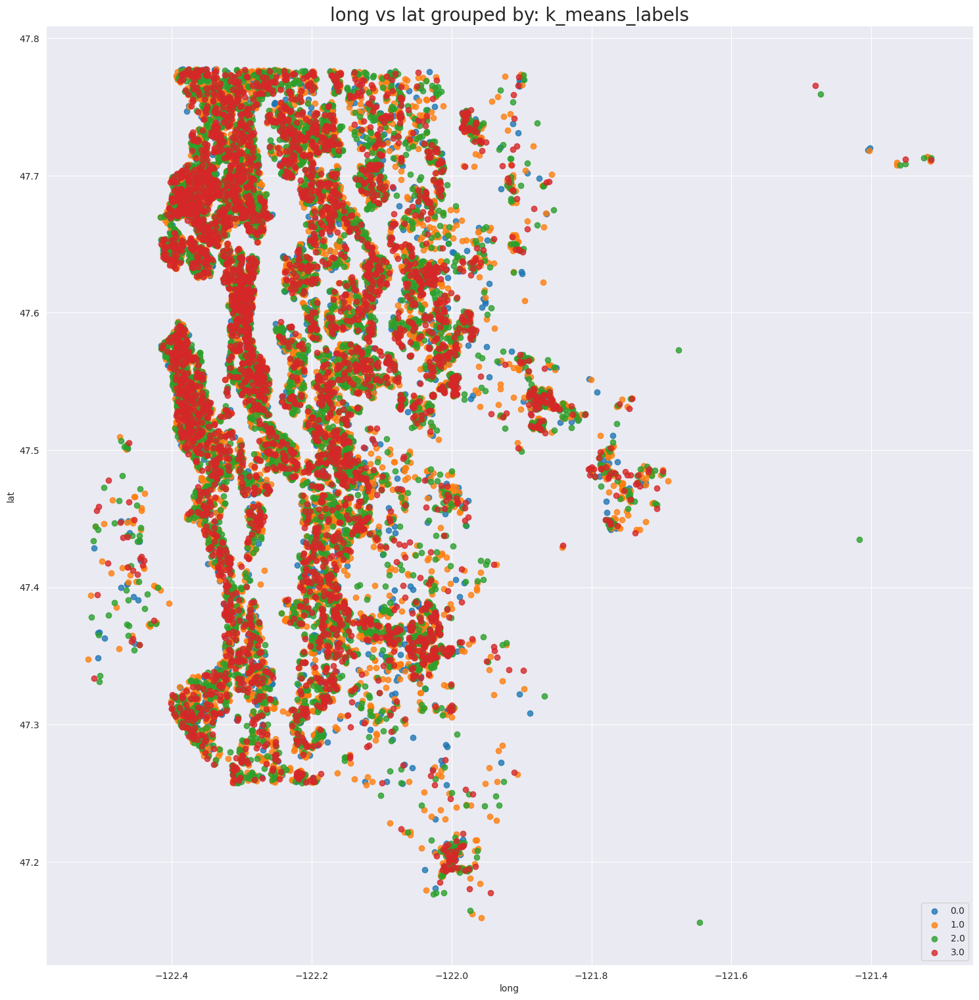

In [462]:
DsmlFunctions.getGroupedScatterPlot(data_dummies, 'long', 'lat', 'k_means_labels')

Lets compare the plot by KMeans clusters vs categorical data like Property Class, Property Tier and Income Tier

In [463]:
temp_data = pd.DataFrame()

temp_data['long'] = data_dummies['long']
temp_data['lat'] = data_dummies['lat']

temp_data["property_class"] = np.where(
    (data['property_class'] == 'class_A'), 1, np.where(
      (data['property_class'] == 'class_B'), 2, np.where(
        (data['property_class'] == 'class_C'), 3, np.where(
          (data['property_class'] == 'class_D'), 4, 4
          )
        )
      )
    )

temp_data["property_tier"] = np.where(
    (data['property_tier'] == 'property_tier_1'), 1, np.where(
      (data['property_tier'] == 'property_tier_2'), 2, np.where(
        (data['property_tier'] == 'property_tier_3'), 3, np.where(
          (data['property_tier'] == 'property_tier_4'), 4, np.where(
              (data['property_tier'] == 'property_tier_5'), 5, np.where(
                  (data['property_tier'] == 'property_tier_6'), 6, np.where(
                      (data['property_tier'] == 'property_tier_7'), 7, np.where(
                          (data['property_tier'] == 'property_tier_8'), 8, 8
                      )
                  )
              )
            )
          )
        )
      )
    )

temp_data["income_tier"] = np.where(
    (data['income_tier'] == 'income_tier_1'), 1, np.where(
      (data['income_tier'] == 'income_tier_2'), 2, np.where(
        (data['income_tier'] == 'income_tier_3'), 3, np.where(
          (data['income_tier'] == 'income_tier_4'), 4, np.where(
              (data['income_tier'] == 'income_tier_5'), 5, 5
            )
          )
        )
      )
    )

temp_data.head()

,long,lat,property_class,property_tier,income_tier
0,-122.183,47.7228,4,4,4
1,-122.274,47.5546,4,4,3
2,-122.256,47.5188,4,4,3
3,-122.213,47.3363,2,2,2
4,-122.285,47.5663,4,4,3



Grouped Scatter Plot


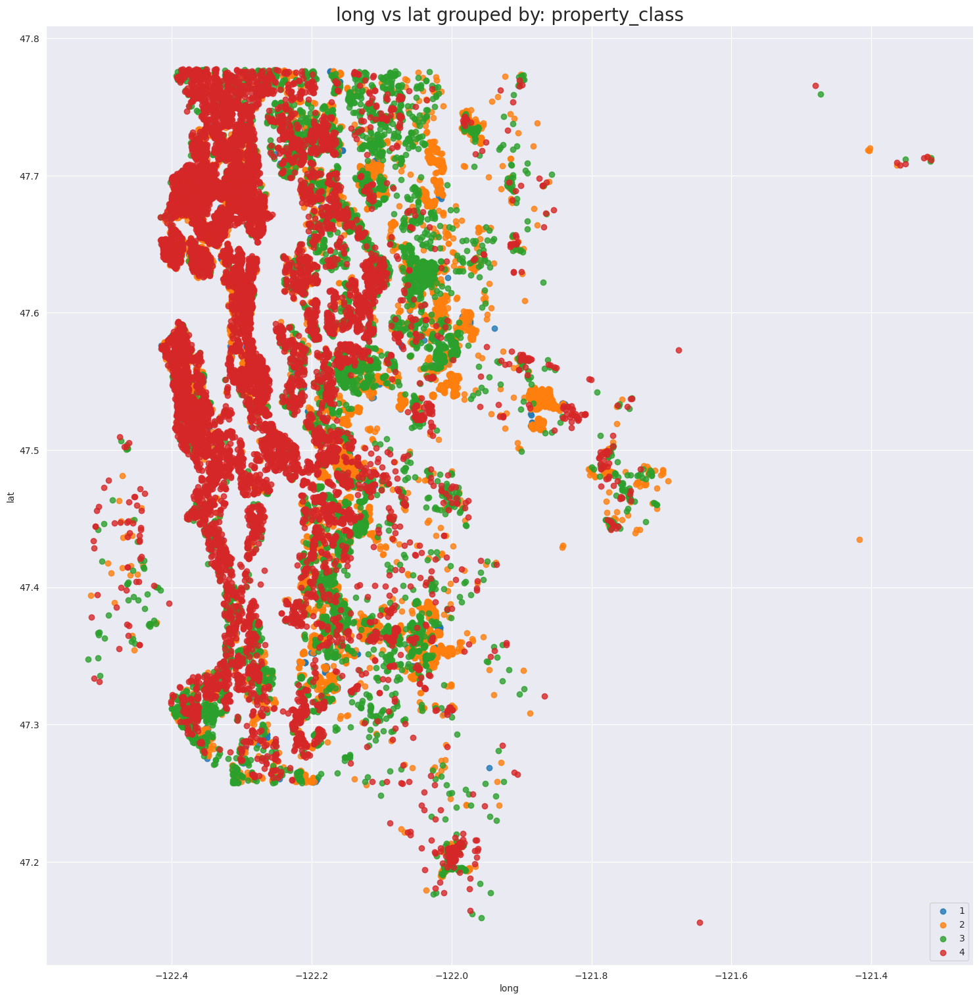


Grouped Scatter Plot


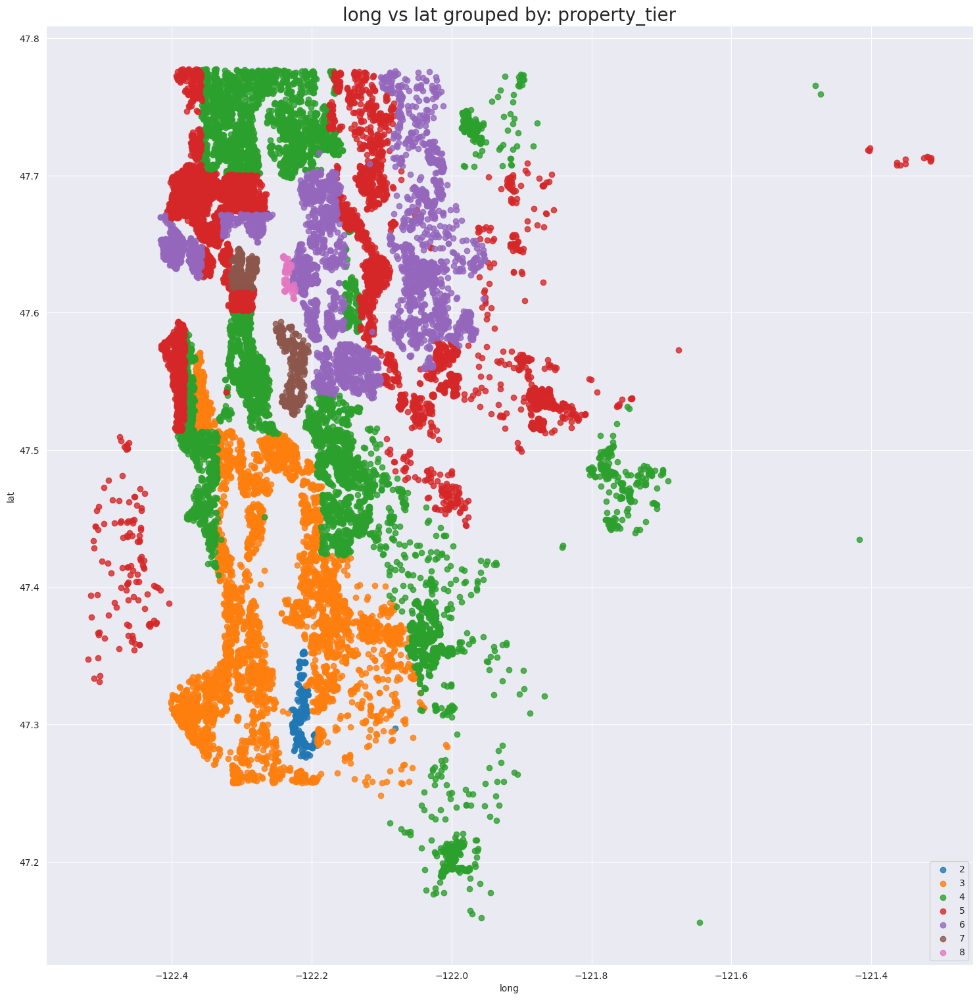


Grouped Scatter Plot


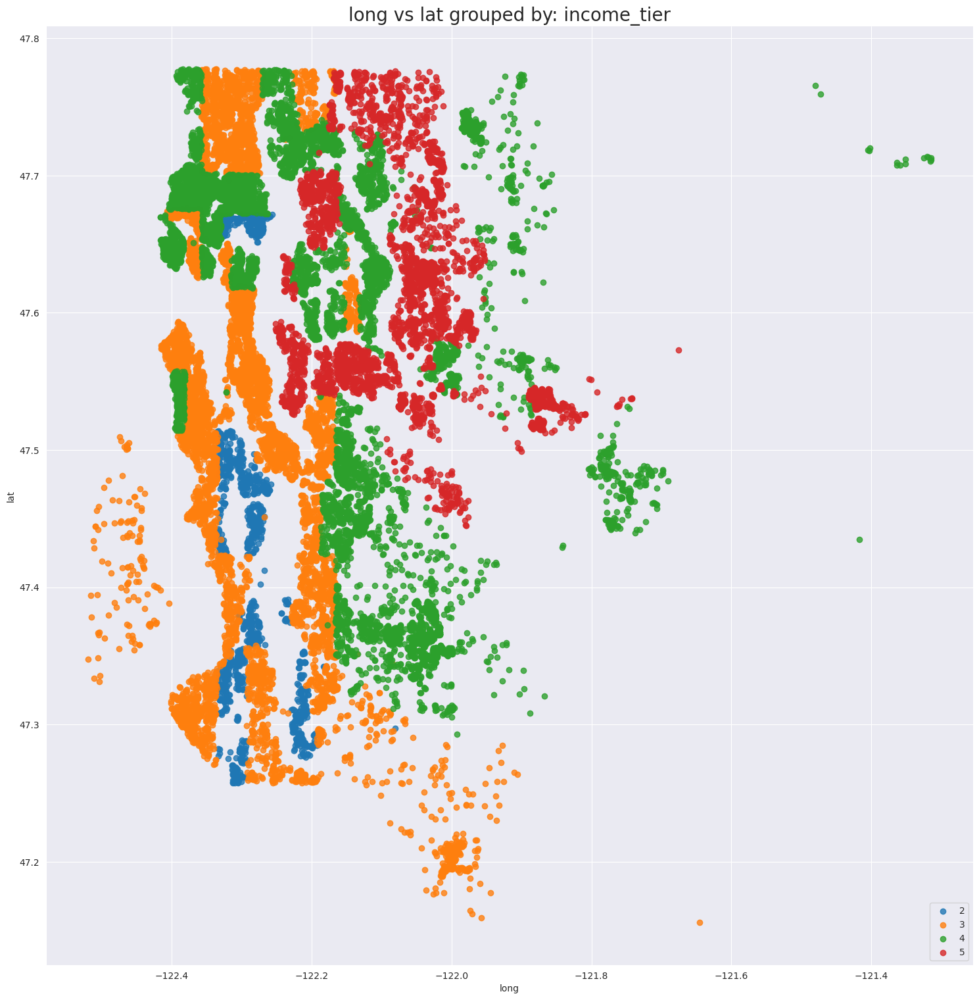

In [464]:
cols_to_plot = ['property_class', 'property_tier', 'income_tier']

for col in cols_to_plot:
  DsmlFunctions.getGroupedScatterPlot(temp_data, 'long', 'lat', col)

# Splitting Data into X (features) and Y (target) variables

In [465]:
# First let's drop the 'cid' column which is just a property identifier
data_dummies.drop(['cid'], axis=1, inplace=True)

# Next we need to drop the k_means_labels column since it is not needed for prediction models
data_dummies.drop(['k_means_labels'], axis=1, inplace=True)

In [466]:
# Run this when testing and need to reset X_train, etc. 
data_dummies = data_dummies_testing_reset
data_dummies.head()

# Now let's handle the TARGET variable 'price'
X = data_dummies.drop(['price'], axis=1)
y = data_dummies['price']

display(X.head())
display(y.head())

,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,year,month,day,median_household_income,median_home_value,condition_1,condition_2,condition_3,condition_4,condition_5,quality_01,quality_03,quality_04,quality_05,quality_06,quality_07,quality_08,quality_09,quality_10,quality_11,quality_12,quality_13,autumn,spring,summer,winter,between_10y_30y,between_30y_50y,over_50y,under_10y,class_A,class_B,class_C,class_D,property_tier_2,property_tier_3,property_tier_4,property_tier_5,property_tier_6,property_tier_7,property_tier_8,income_tier_2,income_tier_3,income_tier_4,income_tier_5
0,4.0,1.75,3050.0,9440.0,1.0,0.0,0.0,1800.0,1250.0,1966.0,0,98034,47.7228,-122.183,2020.0,8660.0,0.0,12490.0,2015,4,27,77688,364900,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0
1,2.0,1.00,670.0,3101.0,1.0,0.0,0.0,670.0,0.0,1948.0,0,98118,47.5546,-122.274,1660.0,4100.0,0.0,3771.0,2015,3,17,52276,350700,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0
2,4.0,2.75,3040.0,2415.0,2.0,1.0,4.0,3040.0,0.0,1966.0,0,98118,47.5188,-122.256,2620.0,2433.0,0.0,5455.0,2014,8,20,52276,350700,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0
3,3.0,2.50,1740.0,3721.0,2.0,0.0,0.0,1740.0,0.0,2009.0,0,98002,47.3363,-122.213,2030.0,3794.0,0.0,5461.0,2014,10,10,43568,167100,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0
4,2.0,1.00,1120.0,4590.0,1.0,0.0,0.0,1120.0,0.0,1924.0,0,98118,47.5663,-122.285,1120.0,5100.0,0.0,5710.0,2015,2,18,52276,350700,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0


0    600000
1    190000
2    735000
3    257000
4    450000
Name: price, dtype: int64

In [467]:
# Splitting into X/Y Train/Test data with 30% saved for testing and using a random number '123' for consistent output

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=123)

# Prediction Models

## Model 0 (Baseline): KMeans with 4 Clusters on X_train (all dummy data)
Based on our previous clustering effort we decided on 4 clusters

In [468]:
base_model_kmeans = KMeans(n_clusters=4, n_init=1)

# Scaling X_train data
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)

X_train_scaled = pd.DataFrame(X_train_scaled)

base_model_kmeans = base_model_kmeans.fit(X_train_scaled)

print(base_model_kmeans.labels_)

[1 1 2 ... 3 2 3]


In [469]:
# Scaling X_test data

X_test_scaled = scaler.fit_transform(X_test)

X_test_scaled = pd.DataFrame(X_test_scaled)

# Getting predictions for Train
base_model_kmeans_predictions_train = base_model_kmeans.predict(X_train_scaled)

# Getting predictions for Test
base_model_kmeans_predictions_test = base_model_kmeans.predict(X_test_scaled)

Defining the Model Comparison Table with SciKit Metrics: MAE, MAPE, RMSE, RSquare

In [470]:
# Define Results table
model_comparison_table = pd.DataFrame()

In [471]:
# Calling personal function to calculare MAE, MAPE, RMSE, R2 with SciKit Metrics

model_comparison_table = DsmlFunctions.getModelComparisonMetrics(
    model_comparison_table,
    0,
    '4C KMeans (All Features)', 
    y_train, 
    y_test, 
    base_model_kmeans_predictions_train, 
    base_model_kmeans_predictions_test
  )


Model Comparison v0


,MAE,MAPE,RMSE,RSquare
Model 0 Train: 4C KMeans (All Features),542106.433134,99.999467,4.282760e+11,-2.186663
Model 0 Test: 4C KMeans (All Features),534866.586309,99.999464,4.166726e+11,-2.190690


## Model 1: KMeans with 4 Clusters on X_train_multicoll (dummy data treated for Multicollinearity via KMeans)
Using same number of 4 clusters

Removing Multicollinearity Using KMeans

Remove features whose collinearity value is above 70%


Data Heat Map


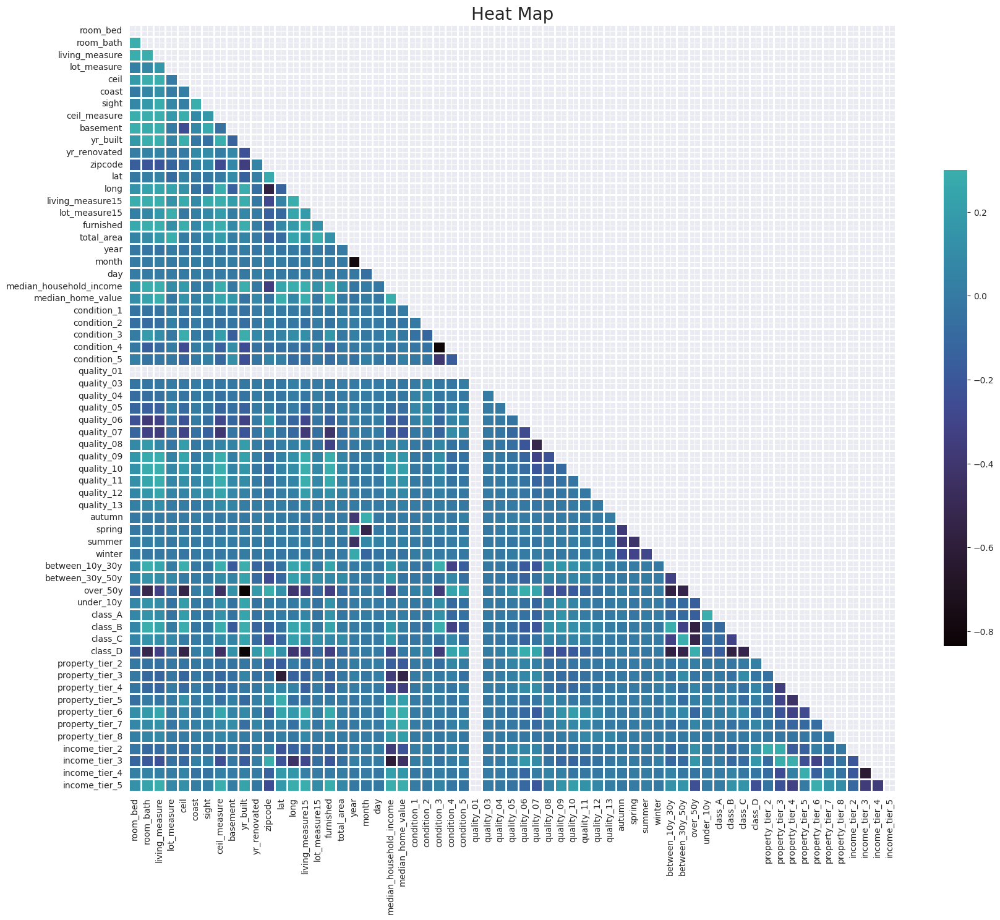

In [472]:
# X_train correlation heatmap to detect Multicollinearity

DsmlFunctions.getGeneralHeatMap(X_train, False)

We will use the threshold of 0.7 to remove Multicollinearity instead of the PCA, because:
-   The PCA will hide the column name when making the Principal Components
-   And we want to be able to know which features have an impact on the target variable 'price'



In [473]:
# Finding columns that have correlation above threshold

correlated_columns = DsmlFunctions.getMulticollHandler(X_train, .70)


Multicollinearity Threshold: 0.7


{'ceil_measure',
 'class_A',
 'class_B',
 'class_C',
 'class_D',
 'condition_4',
 'income_tier_5',
 'living_measure',
 'living_measure15',
 'month',
 'over_50y',
 'quality_09',
 'total_area'}

In [474]:
# Dropping highly correlated columns from X_train and X_test

print(X_train.shape)
print(X_test.shape)

X_train_multicoll = X_train.drop(labels=correlated_columns, axis=1)
X_test_multicoll = X_test.drop(labels=correlated_columns, axis=1)

print(X_train_multicoll.shape)
print(X_test_multicoll.shape)

(15030, 63)
(6442, 63)
(15030, 50)
(6442, 50)


Creating KMeans Model 1 using same number of 4 clusters

In [475]:
model01_kmeans = KMeans(n_clusters=4, n_init=1)

# Scaling X_train_multicoll data
scaler = StandardScaler()

X_train_multicoll = scaler.fit_transform(X_train_multicoll)

X_train_multicoll = pd.DataFrame(X_train_multicoll)

base_model_kmeans = base_model_kmeans.fit(X_train_multicoll)

print(base_model_kmeans.labels_)

[0 0 2 ... 1 2 1]


In [476]:
# Scaling X_test_multicoll data

X_test_multicoll = scaler.fit_transform(X_test_multicoll)

X_test_multicoll = pd.DataFrame(X_test_multicoll)

# Making model for Train
model01_kmeans_predictions_train = base_model_kmeans.predict(X_train_multicoll)

# Making model for Test
model01_kmeans_predictions_test = base_model_kmeans.predict(X_test_multicoll)

In [477]:
# Calling personal function to calculare MAE, MAPE, RMSE, R2 with SciKit Metrics

model_comparison_table = DsmlFunctions.getModelComparisonMetrics(
    model_comparison_table, 
    1,
    '4C KMeans (Auto-Removed)',
    y_train, 
    y_test, 
    model01_kmeans_predictions_train, 
    model01_kmeans_predictions_test
  )


Model Comparison v1


,MAE,MAPE,RMSE,RSquare
Model 0 Train: 4C KMeans (All Features),542106.433134,99.999467,4.282760e+11,-2.186663
Model 0 Test: 4C KMeans (All Features),534866.586309,99.999464,4.166726e+11,-2.190690
Model 1 Train: 4C KMeans (Auto-Removed),542107.050832,99.999686,4.282764e+11,-2.186665
Model 1 Test: 4C KMeans (Auto-Removed),534867.209717,99.999683,4.166729e+11,-2.190693


In [478]:
display(model_comparison_table)

,MAE,MAPE,RMSE,RSquare
Model 0 Train: 4C KMeans (All Features),542106.433134,99.999467,4.282760e+11,-2.186663
Model 0 Test: 4C KMeans (All Features),534866.586309,99.999464,4.166726e+11,-2.190690
Model 1 Train: 4C KMeans (Auto-Removed),542107.050832,99.999686,4.282764e+11,-2.186665
Model 1 Test: 4C KMeans (Auto-Removed),534867.209717,99.999683,4.166729e+11,-2.190693


We see that there is not much difference between the MAE of our initial 4 Cluster KMeans prediction models, so we will use other methods as well as manually select the features to be removed.

### Manually Removing Feautres from X_train
We will remove features that were used to create the categorical pre-dummy columns: sell_season, property_class, property_tier, income_tier
- Used colums to delete:
  - dayhours, zipcode, yr_built, year, month, day, condition, median_household_income, median_home_value, under_10y, between_10y_30y, between_30y_50y, over_50y
- Columns that are simply not needed:
  - lat, long

In [479]:
# Dropping columns from X_train
dropped_columns = ['zipcode', 'yr_built', 'year', 'month', 'day', 'condition_1', 'condition_2', 'condition_3', 'condition_4', 'condition_5', 'median_household_income', 'median_home_value', 'under_10y', 'between_10y_30y', 'between_30y_50y', 'over_50y', 'lat', 'long']
X_train.drop(dropped_columns, axis=1, inplace=True)
X_train.head()

,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,ceil_measure,basement,yr_renovated,living_measure15,lot_measure15,furnished,total_area,quality_01,quality_03,quality_04,quality_05,quality_06,quality_07,quality_08,quality_09,quality_10,quality_11,quality_12,quality_13,autumn,spring,summer,winter,class_A,class_B,class_C,class_D,property_tier_2,property_tier_3,property_tier_4,property_tier_5,property_tier_6,property_tier_7,property_tier_8,income_tier_2,income_tier_3,income_tier_4,income_tier_5
9192,3.0,2.25,1380.0,7226.0,1.0,0.0,0.0,1140.0,240.0,0,1640.0,7823.0,0.0,8606.0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0
2349,3.0,1.00,1100.0,4184.0,1.0,0.0,0.0,1100.0,0.0,0,1630.0,4366.0,0.0,5284.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0
15969,4.0,3.00,3150.0,9318.0,2.0,0.0,0.0,3150.0,0.0,0,3150.0,9318.0,1.0,12468.0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1
12455,4.0,2.25,4470.0,86225.0,2.0,0.0,0.0,4470.0,0.0,0,3850.0,97049.0,1.0,90695.0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1
21231,3.0,1.75,1330.0,10523.0,1.0,0.0,0.0,1000.0,330.0,0,1320.0,8775.0,0.0,11853.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0


In [480]:
# Dropping columns from X_test
X_test.drop(dropped_columns, axis=1, inplace=True)
X_test.head()

,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,ceil_measure,basement,yr_renovated,living_measure15,lot_measure15,furnished,total_area,quality_01,quality_03,quality_04,quality_05,quality_06,quality_07,quality_08,quality_09,quality_10,quality_11,quality_12,quality_13,autumn,spring,summer,winter,class_A,class_B,class_C,class_D,property_tier_2,property_tier_3,property_tier_4,property_tier_5,property_tier_6,property_tier_7,property_tier_8,income_tier_2,income_tier_3,income_tier_4,income_tier_5
9593,4.0,1.50,1740.0,8160.0,1.5,0.0,0.0,1400.0,340.0,0,1600.0,8160.0,0.0,9900.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0
611,3.0,1.00,1740.0,4800.0,1.0,0.0,0.0,1740.0,0.0,0,1600.0,4800.0,0.0,6540.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0
19592,4.0,2.25,2160.0,5600.0,1.0,0.0,0.0,1080.0,1080.0,0,1850.0,5150.0,0.0,7760.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0
18458,3.0,1.75,2140.0,13068.0,1.0,0.0,0.0,1460.0,680.0,0,2090.0,17424.0,0.0,15208.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0
14307,2.0,1.00,910.0,295772.0,1.0,0.0,0.0,910.0,0.0,0,2050.0,48351.0,0.0,296682.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0


## Model 2: OLS Linear Regression on X_train (Manual Features)
Using the features we manually removed that were used to bin the engineered features

In [481]:
# let's add the intercept to data
X_train_ols = sm.add_constant(X_train)
X_test_ols = sm.add_constant(X_test)

# create the model
model02_ols = sm.OLS(y_train, X_train_ols).fit()

# get the model summary
model02_ols.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.794
Model:                            OLS   Adj. R-squared:                  0.793
Method:                 Least Squares   F-statistic:                     1477.
Date:                Mon, 10 Apr 2023   Prob (F-statistic):               0.00
Time:                        04:06:39   Log-Likelihood:            -2.0204e+05
No. Observations:               15030   AIC:                         4.042e+05
Df Residuals:                   14990   BIC:                         4.045e+05
Df Model:                          39                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const             3.134e+05   2.09e+04     14.981      0.000    2.72e+05    3.54e+05
room_bed         -1.706e+04   2037.916     -8.371      0.000   -2.11e+04   -1.31e+04
room_bath         2.794e+04   3301.644      8.462      0.000    2.15e+04    3.44e+04
living_measure      82.0734     54.004      1.520      0.129     -23.781     187.928
lot_measure          0.3268      0.498      0.656      0.512      -0.650       1.303
ceil              -479.8621   3990.583     -0.120      0.904   -8301.894    7342.169
coast             6.368e+05   1.72e+04     37.073      0.000    6.03e+05     6.7e+05
sight             4.753e+04   2127.922     22.337      0.000    4.34e+04    5.17e+04
ceil_measure        75.8185     54.003      1.404      0.160     -30.034     181.671
basement            69.0100     54.033      1.277      0.202     -36.901     174.922
yr_renovated      3.959e+04   7113.260      5.565      0.000    2.56e+04    5.35e+04
living_measure15     6.9320      3.481      1.992      0.046       0.109      13.755
lot_measure15       -0.5233      0.070     -7.505      0.000      -0.660      -0.387
furnished          2.57e+04   8.36e+04      0.307      0.758   -1.38e+05     1.9e+05
total_area          -0.2113      0.500     -0.423      0.673      -1.191       0.768
quality_01       -3.318e-09   4.79e-10     -6.927      0.000   -4.26e-09   -2.38e-09
quality_03       -1.903e+05   1.14e+05     -1.670      0.095   -4.14e+05    3.31e+04
quality_04       -2.941e+05   5.03e+04     -5.846      0.000   -3.93e+05   -1.95e+05
quality_05       -2.987e+05      4e+04     -7.461      0.000   -3.77e+05    -2.2e+05
quality_06       -2.804e+05   3.86e+04     -7.266      0.000   -3.56e+05   -2.05e+05
quality_07       -2.663e+05   3.83e+04     -6.946      0.000   -3.41e+05   -1.91e+05
quality_08       -2.444e+05   3.83e+04     -6.375      0.000   -3.19e+05   -1.69e+05
quality_09        -1.93e+05   4.89e+04     -3.943      0.000   -2.89e+05    -9.7e+04
quality_10       -5.447e+04    4.9e+04     -1.111      0.266   -1.51e+05    4.16e+04
quality_11        1.446e+05   4.99e+04      2.895      0.004    4.67e+04    2.42e+05
quality_12        6.111e+05   5.28e+04     11.581      0.000    5.08e+05    7.14e+05
quality_13        1.379e+06   7.33e+04     18.809      0.000    1.24e+06    1.52e+06
autumn            6.463e+04   5736.984     11.266      0.000    5.34e+04    7.59e+04
spring            9.552e+04   5665.644     16.860      0.000    8.44e+04    1.07e+05
summer            7.546e+04   5732.053     13.164      0.000    6.42e+04    8.67e+04
winter            7.781e+04   5919.273     13.145      0.000    6.62e+04    8.94e+04
class_A           9.754e+04   8795.823     11.089      0.000    8.03e+04    1.15e+05
class_B           4.294e+04   6265.926      6.853      0.000    3.07e+04    5.52e+04
class_C           5.122

A p-value of less than 0.05 is considered to be statistically significant.
Therefore the features above 5% that don't significantly impacting price prediction are:
- living_measure, lot_measure, ceil, ceil_measure, basement, living_measure15, furnished, total_area, quality_03, quality_10, income_tier_5

Let's check how the current model before removing features performs train vs test

In [482]:
# Insample Prediction
model02_ols_predictions_train = model02_ols.predict(X_train_ols)

# Prediction on test data
model02_ols_predictions_test = model02_ols.predict(X_test_ols)

In [483]:
# Calling personal function to calculare MAE, MAPE, RMSE, R2

model_comparison_table = DsmlFunctions.getModelComparisonMetrics(
    model_comparison_table, 
    2,
    'OLS Linear Regression (Manually Removed)',
    y_train, 
    y_test, 
    model02_ols_predictions_train, 
    model02_ols_predictions_test
  )


Model Comparison v2


,MAE,MAPE,RMSE,RSquare
Model 0 Train: 4C KMeans (All Features),542106.433134,99.999467,4.282760e+11,-2.186663
Model 0 Test: 4C KMeans (All Features),534866.586309,99.999464,4.166726e+11,-2.190690
Model 1 Train: 4C KMeans (Auto-Removed),542107.050832,99.999686,4.282764e+11,-2.186665
Model 1 Test: 4C KMeans (Auto-Removed),534867.209717,99.999683,4.166729e+11,-2.190693
Model 2 Train: OLS Linear Regression (Manually Removed),101994.008018,19.949879,2.774914e+10,0.793528
Model 2 Test: OLS Linear Regression (Manually Removed),101284.521270,20.117374,2.750227e+10,0.789400


## Model 3: OLS Linear Regression on X_train (Low P-Values)
Removing the features with P-Value > 0.05 mentioned above

In [484]:
# Dropping columns from X_train
high_p_columns = ['living_measure', 'lot_measure', 'ceil', 'ceil_measure', 'basement', 'living_measure15', 'furnished', 'total_area', 'quality_03', 'quality_10', 'income_tier_5']
X_train.drop(high_p_columns, axis=1, inplace=True)
X_train.head()

,room_bed,room_bath,coast,sight,yr_renovated,lot_measure15,quality_01,quality_04,quality_05,quality_06,quality_07,quality_08,quality_09,quality_11,quality_12,quality_13,autumn,spring,summer,winter,class_A,class_B,class_C,class_D,property_tier_2,property_tier_3,property_tier_4,property_tier_5,property_tier_6,property_tier_7,property_tier_8,income_tier_2,income_tier_3,income_tier_4
9192,3.0,2.25,0.0,0.0,0,7823.0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1
2349,3.0,1.00,0.0,0.0,0,4366.0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1
15969,4.0,3.00,0.0,0.0,0,9318.0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0
12455,4.0,2.25,0.0,0.0,0,97049.0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0
21231,3.0,1.75,0.0,0.0,0,8775.0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0


In [485]:
# Dropping columns from X_test
X_test.drop(high_p_columns, axis=1, inplace=True)
X_test.head()

,room_bed,room_bath,coast,sight,yr_renovated,lot_measure15,quality_01,quality_04,quality_05,quality_06,quality_07,quality_08,quality_09,quality_11,quality_12,quality_13,autumn,spring,summer,winter,class_A,class_B,class_C,class_D,property_tier_2,property_tier_3,property_tier_4,property_tier_5,property_tier_6,property_tier_7,property_tier_8,income_tier_2,income_tier_3,income_tier_4
9593,4.0,1.50,0.0,0.0,0,8160.0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1
611,3.0,1.00,0.0,0.0,0,4800.0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0
19592,4.0,2.25,0.0,0.0,0,5150.0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0
18458,3.0,1.75,0.0,0.0,0,17424.0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0
14307,2.0,1.00,0.0,0.0,0,48351.0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1


In [486]:
# let's add the intercept to data
X_train_ols_pvalue = sm.add_constant(X_train)
X_test_ols_pvalue = sm.add_constant(X_test)

# create the model
model03_ols_pvalue = sm.OLS(y_train, X_train_ols_pvalue).fit()

# get the model summary
model03_ols_pvalue.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.759
Model:                            OLS   Adj. R-squared:                  0.759
Method:                 Least Squares   F-statistic:                     1577.
Date:                Mon, 10 Apr 2023   Prob (F-statistic):               0.00
Time:                        04:06:40   Log-Likelihood:            -2.0319e+05
No. Observations:               15030   AIC:                         4.064e+05
Df Residuals:                   14999   BIC:                         4.067e+05
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const            3.932e+05   7961.752     49.392      0.000    3.78e+05    4.09e+05
room_bed          2.25e+04   2022.940     11.123      0.000    1.85e+04    2.65e+04
room_bath        9.476e+04   3183.715     29.764      0.000    8.85e+04    1.01e+05
coast            6.567e+05   1.85e+04     35.501      0.000     6.2e+05    6.93e+05
sight             5.89e+04   2231.444     26.398      0.000    5.45e+04    6.33e+04
yr_renovated     4.327e+04   7628.188      5.672      0.000    2.83e+04    5.82e+04
lot_measure15      -0.0138      0.054     -0.254      0.799      -0.120       0.093
quality_01      -9.292e-10   4.53e-11    -20.517      0.000   -1.02e-09    -8.4e-10
quality_04      -4.884e+05   3.95e+04    -12.359      0.000   -5.66e+05   -4.11e+05
quality_05      -4.916e+05    1.6e+04    -30.817      0.000   -5.23e+05    -4.6e+05
quality_06      -4.585e+05   9756.006    -46.996      0.000   -4.78e+05   -4.39e+05
quality_07      -4.198e+05   7836.214    -53.572      0.000   -4.35e+05   -4.04e+05
quality_08       -3.56e+05   7305.136    -48.734      0.000    -3.7e+05   -3.42e+05
quality_09      -2.064e+05   7673.703    -26.893      0.000   -2.21e+05   -1.91e+05
quality_11       2.918e+05   1.28e+04     22.828      0.000    2.67e+05    3.17e+05
quality_12       8.823e+05   2.32e+04     38.104      0.000    8.37e+05    9.28e+05
quality_13       1.794e+06   6.42e+04     27.932      0.000    1.67e+06    1.92e+06
autumn             8.5e+04   3305.984     25.712      0.000    7.85e+04    9.15e+04
spring           1.142e+05   3102.297     36.827      0.000    1.08e+05     1.2e+05
summer           9.708e+04   3128.467     31.031      0.000    9.09e+04    1.03e+05
winter           9.691e+04   3582.633     27.050      0.000    8.99e+04    1.04e+05
class_A          1.095e+05   7697.420     14.219      0.000    9.44e+04    1.25e+05
class_B          5.396e+04   3794.235     14.220      0.000    4.65e+04    6.14e+04
class_C          6.875e+04   3718.732     18.488      0.000    6.15e+04     7.6e+04
class_D          1.611e+05   4007.513     40.195      0.000    1.53e+05    1.69e+05
property_tier_2 -3.527e+05   1.61e+04    -21.906      0.000   -3.84e+05   -3.21e+05
property_tier_3 -3.487e+05   6561.895    -53.144      0.000   -3.62e+05   -3.36e+05
property_tier_4 -2.359e+05   6202.359    -38.035      0.000   -2.48e+05   -2.24e+05
property_tier_5 -8.158e+04   5924.858    -13.769      0.000   -9.32e+04      -7e+04
property_tier_6  8.037e+04   6086.460     13.205      0.000    6.84e+04    9.23e+04
property_tier_7   2.86e+05   9579.308     29.853      0.000    2.67e+05    3.05e+05
property_tier_8  1.046e+06   2.87e+04     36.446      0.000     9.9e+05     1.1e+06
income_tier_2    1.556e+05   9053.912     17.190      0.000    1.38e+05    1.73e+05
income_tier_3    1.573e+05   6345.500     24.790      0.000

We can see that only lot_measure15 has a P-Value > 5% so there isn't much more to gain with this method.

In [487]:
# Insample Prediction
model03_ols_pvalue_predictions_train = model03_ols_pvalue.predict(X_train_ols_pvalue)

# Prediction on test data
model03_ols_pvalue_predictions_test = model03_ols_pvalue.predict(X_test_ols_pvalue)

In [488]:
# Calling personal function to calculare MAE, MAPE, RMSE, R2

model_comparison_table = DsmlFunctions.getModelComparisonMetrics(
    model_comparison_table, 
    3,
    'OLS Linear Regression (Removed P-Value > 5%)',
    y_train, 
    y_test, 
    model03_ols_pvalue_predictions_train, 
    model03_ols_pvalue_predictions_test
  )


Model Comparison v3


,MAE,MAPE,RMSE,RSquare
Model 0 Train: 4C KMeans (All Features),542106.433134,99.999467,4.282760e+11,-2.186663
Model 0 Test: 4C KMeans (All Features),534866.586309,99.999464,4.166726e+11,-2.190690
Model 1 Train: 4C KMeans (Auto-Removed),542107.050832,99.999686,4.282764e+11,-2.186665
Model 1 Test: 4C KMeans (Auto-Removed),534867.209717,99.999683,4.166729e+11,-2.190693
Model 2 Train: OLS Linear Regression (Manually Removed),101994.008018,19.949879,2.774914e+10,0.793528
Model 2 Test: OLS Linear Regression (Manually Removed),101284.521270,20.117374,2.750227e+10,0.789400
Model 3 Train: OLS Linear Regression (Removed P-Value > 5%),108932.646903,21.005038,3.234751e+10,0.759313
Model 3 Test: OLS Linear Regression (Removed P-Value > 5%),107570.068287,21.529895,3.064853e+10,0.765307


## Multicollinearity: Using Variation Inflation Factor (VIF)
We will try to further reduce Multicollinearity by checking the VIF.

If VIF exceeds ~5 we say there is moderate VIF and if it is 10 or exceeding 10, it shows signs of high multi-collinearity. Can be Dropped.

In [489]:
# First we will remove the feature that has P-Value > 5%

# On Train
X_train.drop(['lot_measure15'], axis=1, inplace=True)

# On Test
X_test.drop(['lot_measure15'], axis=1, inplace=True)

In [490]:
# Using a personal function from StatsModel VIF
 
vif = DsmlFunctions.getVIF(X_train)


VIF
            feature       VIF
0          room_bed  1.545785
1         room_bath  2.751781
2             coast  1.215081
3             sight  1.351177
4      yr_renovated  1.088473
5        quality_01       NaN
6        quality_04  1.058189
7        quality_05  1.419037
8        quality_06  3.775594
9        quality_07  6.856602
10       quality_08  4.963905
11       quality_09  2.921290
12       quality_11  1.321682
13       quality_12  1.102175
14       quality_13  1.017531
15           autumn       inf
16           spring       inf
17           summer       inf
18           winter       inf
19          class_A       inf
20          class_B       inf
21          class_C       inf
22          class_D       inf
23  property_tier_2       inf
24  property_tier_3       inf
25  property_tier_4       inf
26  property_tier_5       inf
27  property_tier_6       inf
28  property_tier_7       inf
29  property_tier_8       inf
30    income_tier_2  2.050071
31    income_tier_3  4.401495
32   

We can see there are several columns values that have NaN, INF or are close to 5, indicating their is multicollinearity and can be dropped:
- quality_01, quality_07, quality_08, autumn, winter, spring, summer, class_A, class_B, class_C, property_tier_2, property_tier_3, property_tier_4, property_tier_5, property_tier_6, property_tier_7,property_tier_8, income_tier_3

In [491]:
# Dropping
vif_columns = ['quality_01', 'quality_07', 'quality_08', 'autumn', 'winter', 'spring', 'summer', 'class_A', 'class_B', 'class_C', 'class_D', 'property_tier_2', 'property_tier_3', 'property_tier_4', 'property_tier_5', 'property_tier_6', 'property_tier_7','property_tier_8', 'income_tier_3']

# Vif for Train
X_train_vif = X_train.drop(vif_columns, axis=1)

X_train_vif.head()

,room_bed,room_bath,coast,sight,yr_renovated,quality_04,quality_05,quality_06,quality_09,quality_11,quality_12,quality_13,income_tier_2,income_tier_4
9192,3.0,2.25,0.0,0.0,0,0,0,0,0,0,0,0,0,1
2349,3.0,1.00,0.0,0.0,0,0,0,0,0,0,0,0,0,1
15969,4.0,3.00,0.0,0.0,0,0,0,0,1,0,0,0,0,0
12455,4.0,2.25,0.0,0.0,0,0,0,0,0,0,0,0,0,0
21231,3.0,1.75,0.0,0.0,0,0,0,0,0,0,0,0,0,0


In [492]:
# VIF Train
X_test_vif = X_test.drop(vif_columns, axis=1)

X_test_vif.head()

,room_bed,room_bath,coast,sight,yr_renovated,quality_04,quality_05,quality_06,quality_09,quality_11,quality_12,quality_13,income_tier_2,income_tier_4
9593,4.0,1.50,0.0,0.0,0,0,0,0,0,0,0,0,0,1
611,3.0,1.00,0.0,0.0,0,0,0,0,0,0,0,0,0,0
19592,4.0,2.25,0.0,0.0,0,0,0,0,0,0,0,0,0,0
18458,3.0,1.75,0.0,0.0,0,0,0,0,0,0,0,0,0,0
14307,2.0,1.00,0.0,0.0,0,0,1,0,0,0,0,0,0,1


## Model 4: OLS Linear Regression on X_train (Removed VIF)
Removing the features with P-Value > 0.05 mentioned above

In [493]:
# let's add the intercept to data
X_train_ols_vif = sm.add_constant(X_train_vif)
X_test_ols_vif = sm.add_constant(X_test_vif)

# create the model
model04_ols_vif = sm.OLS(y_train, X_train_ols_vif).fit()

# get the model summary
model04_ols_vif.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.520
Model:                            OLS   Adj. R-squared:                  0.519
Method:                 Least Squares   F-statistic:                     1161.
Date:                Mon, 10 Apr 2023   Prob (F-statistic):               0.00
Time:                        04:06:41   Log-Likelihood:            -2.0838e+05
No. Observations:               15030   AIC:                         4.168e+05
Df Residuals:                   15015   BIC:                         4.169e+05
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const          9.801e+04   9521.064     10.294      0.000    7.93e+04    1.17e+05
room_bed       2.688e+04   2729.334      9.849      0.000    2.15e+04    3.22e+04
room_bath      1.275e+05   3628.650     35.127      0.000     1.2e+05    1.35e+05
coast          6.133e+05   2.61e+04     23.507      0.000    5.62e+05    6.64e+05
sight          9.373e+04   3047.666     30.754      0.000    8.78e+04    9.97e+04
yr_renovated   1.301e+05   1.04e+04     12.506      0.000     1.1e+05    1.51e+05
quality_04    -9.504e+04   5.45e+04     -1.745      0.081   -2.02e+05    1.17e+04
quality_05    -9.305e+04   1.93e+04     -4.827      0.000   -1.31e+05   -5.53e+04
quality_06    -5.647e+04   7742.024     -7.293      0.000   -7.16e+04   -4.13e+04
quality_09     1.547e+05   6675.327     23.181      0.000    1.42e+05    1.68e+05
quality_11     6.655e+05   1.65e+04     40.390      0.000    6.33e+05    6.98e+05
quality_12     1.255e+06   3.19e+04     39.342      0.000    1.19e+06    1.32e+06
quality_13     2.212e+06   9.02e+04     24.511      0.000    2.03e+06    2.39e+06
income_tier_2 -5.625e+04   9137.035     -6.156      0.000   -7.42e+04   -3.83e+04
income_tier_4  6.519e+04   4378.651     14.888      0.000    5.66e+04    7.38e+04
==============================================================================
Omnibus:                     8736.098   Durbin-Watson:                   2.018
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           218565.412
Skew:                           2.320   Prob(JB):                         0.00
Kurtosis:                      21.096   Cond. No.                         185.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [494]:
# Insample Prediction
model04_ols_vif_predictions_train = model04_ols_vif.predict(X_train_ols_vif)

# Prediction on test data
model04_ols_vif_predictions_test = model04_ols_vif.predict(X_test_ols_vif)

In [495]:
# Calling personal function to calculare MAE, MAPE, RMSE, R2

model_comparison_table = DsmlFunctions.getModelComparisonMetrics(
    model_comparison_table, 
    4,
    'OLS Linear Regression (Removed VIFs)',
    y_train, 
    y_test, 
    model04_ols_vif_predictions_train, 
    model04_ols_vif_predictions_test
  )


Model Comparison v4


,MAE,MAPE,RMSE,RSquare
Model 0 Train: 4C KMeans (All Features),542106.433134,99.999467,4.282760e+11,-2.186663
Model 0 Test: 4C KMeans (All Features),534866.586309,99.999464,4.166726e+11,-2.190690
Model 1 Train: 4C KMeans (Auto-Removed),542107.050832,99.999686,4.282764e+11,-2.186665
Model 1 Test: 4C KMeans (Auto-Removed),534867.209717,99.999683,4.166729e+11,-2.190693
Model 2 Train: OLS Linear Regression (Manually Removed),101994.008018,19.949879,2.774914e+10,0.793528
Model 2 Test: OLS Linear Regression (Manually Removed),101284.521270,20.117374,2.750227e+10,0.789400
Model 3 Train: OLS Linear Regression (Removed P-Value > 5%),108932.646903,21.005038,3.234751e+10,0.759313
Model 3 Test: OLS Linear Regression (Removed P-Value > 5%),107570.068287,21.529895,3.064853e+10,0.765307
Model 4 Train: OLS Linear Regression (Removed VIFs),170032.260038,35.172347,6.453058e+10,0.519849
Model 4 Test: OLS Linear Regression (Removed VIFs),166355.920856,35.702954,5.986877e+10,0.541552


From these models we can see that as we remove features the RSquared drops. But is negative for the KMeans models, so we'll reject them.

Model 2:
- Has the best RSquared value of 79%, and it doesn't vary much between train and test meaning it is not overfitting.
- Also has the smallest MAE/MAPE meaning the smallest discrepancy between predicted and actual values.

Next we'll try to improve the model.

## Cross Validation using SKLearn Linear Regression
We'll use K-Fold of 10 for the Cross Validation and compare across all the models:
- Model 0 - X_train_scaled
- Model 1 - X_train_multicoll 
- Model 2 - X_train_ols
- Model 3 - X_train_ols_pvalue 
- Model 4 - X_train_ols_vif

In [496]:
# comparing the x_trains: X_train_scaled, X_train_multicoll, X_train_ols, X_train_ols_pvalue, X_train_ols_vif

# build the regression model using Sklearn Linear regression
linearregression = LinearRegression()                                    

x_train_variables = {
    'X_train_scaled': X_train_scaled, 
    'X_train_multicoll': X_train_multicoll, 
    'X_train_ols': X_train_ols, 
    'X_train_ols_pvalue': X_train_ols_pvalue, 
    'X_train_ols_vif': X_train_ols_vif
}

for key, value in x_train_variables.items():
  index = list(x_train_variables.keys()).index(key)
  print(f"Model {index}: {key}")

  # cv=10 represents data is divided into 10 folds
  cv_Score11_train = cross_val_score(linearregression, value, y_train, cv = 10)
  cv_Score12_train = cross_val_score(linearregression, value, y_train, cv = 10, scoring = 'neg_mean_squared_error')                                  

  print("RSquared: %0.3f (+/- %0.3f)" % (cv_Score11_train.mean(), cv_Score11_train.std() * 2))
  print("Mean Squared Error: %0.3f (+/- %0.3f)" % (-1*cv_Score12_train.mean(), cv_Score12_train.std() * 2))
  print('-------------------------------------')
  print('')

Model 0: X_train_scaled
RSquared: 0.815 (+/- 0.048)
Mean Squared Error: 24948266426.227 (+/- 10295447264.802)
-------------------------------------

Model 1: X_train_multicoll
RSquared: 0.785 (+/- 0.057)
Mean Squared Error: 29067952087.755 (+/- 13147224150.371)
-------------------------------------

Model 2: X_train_ols
RSquared: 0.790 (+/- 0.051)
Mean Squared Error: 28278547301.063 (+/- 11123438449.677)
-------------------------------------

Model 3: X_train_ols_pvalue
RSquared: 0.757 (+/- 0.058)
Mean Squared Error: 32841729282.006 (+/- 14009885730.499)
-------------------------------------

Model 4: X_train_ols_vif
RSquared: 0.515 (+/- 0.062)
Mean Squared Error: 64949908700.958 (+/- 15460609111.654)
-------------------------------------



From the Cross Validation we can see that the base model has the highest RSquared since it has the most number of independent variables (features).

*Model 2 confirms the highest RSquared of 79% with a Standard Deviation of 5.1%*

## Model 5: Decision Tree based on Model 2 (OLS with all features)
Using the X_train data from Model 2: X_train_ols

In [497]:
# Defining the Descision tree regressor
model05_dtree_from_model02 = DecisionTreeRegressor(min_samples_split = 2)

# Fitting Descision Tree regressor to train dataset
model05_dtree_from_model02.fit(X_train_ols,y_train)

DecisionTreeRegressor()

In [498]:
# Insample Prediction
model05_dtree_from_model02_predictions_train = model05_dtree_from_model02.predict(X_train_ols)

# Prediction on test data
model05_dtree_from_model02_predictions_test = model05_dtree_from_model02.predict(X_test_ols)

In [499]:
# Calling personal function to calculare MAE, MAPE, RMSE, R2

model_comparison_table = DsmlFunctions.getModelComparisonMetrics(
    model_comparison_table, 
    5,
    'Decision Tree (from Model 2)',
    y_train, 
    y_test, 
    model05_dtree_from_model02_predictions_train, 
    model05_dtree_from_model02_predictions_test
  )


Model Comparison v5


,MAE,MAPE,RMSE,RSquare
Model 0 Train: 4C KMeans (All Features),542106.433134,99.999467,4.282760e+11,-2.186663
Model 0 Test: 4C KMeans (All Features),534866.586309,99.999464,4.166726e+11,-2.190690
Model 1 Train: 4C KMeans (Auto-Removed),542107.050832,99.999686,4.282764e+11,-2.186665
Model 1 Test: 4C KMeans (Auto-Removed),534867.209717,99.999683,4.166729e+11,-2.190693
Model 2 Train: OLS Linear Regression (Manually Removed),101994.008018,19.949879,2.774914e+10,0.793528
Model 2 Test: OLS Linear Regression (Manually Removed),101284.521270,20.117374,2.750227e+10,0.789400
Model 3 Train: OLS Linear Regression (Removed P-Value > 5%),108932.646903,21.005038,3.234751e+10,0.759313
Model 3 Test: OLS Linear Regression (Removed P-Value > 5%),107570.068287,21.529895,3.064853e+10,0.765307
Model 4 Train: OLS Linear Regression (Removed VIFs),170032.260038,35.172347,6.453058e+10,0.519849
Model 4 Test: OLS Linear Regression (Removed VIFs),166355.920856,35.702954,5.986877e+10,0.541552


For Model 5 the difference between Train and Test show significant overfitting, likely of a Decision Tree.

Let's compare this Decision Tree with Model 4, the last OLS model with least features to see if it changes overfitting.

### Decision Tree Plot for mmodel with overfitting: Model 5 (OLS with all features)

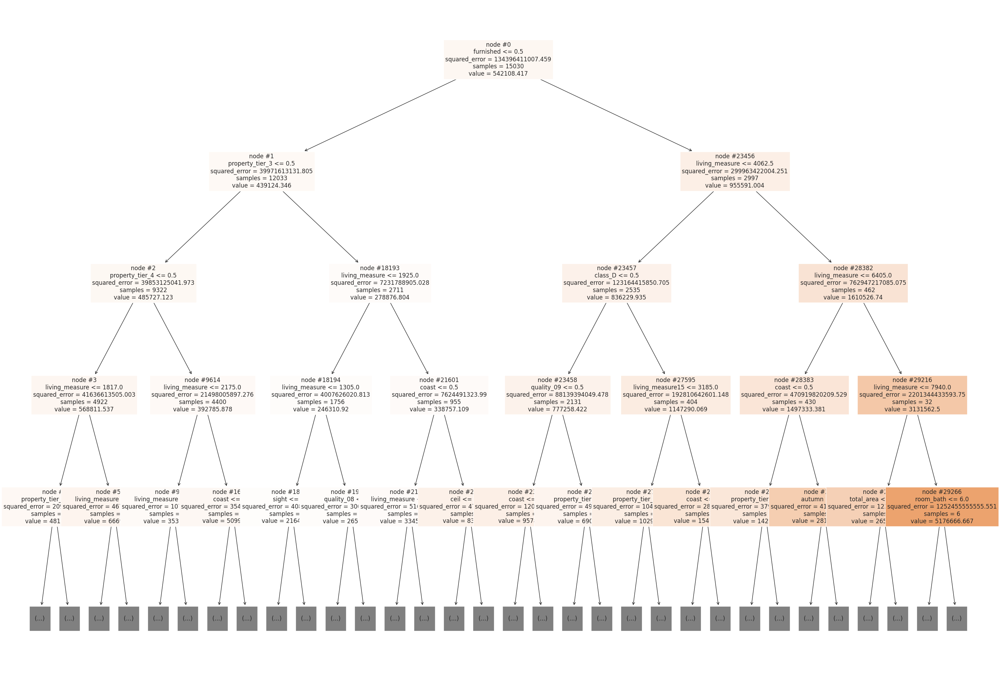

In [500]:
features = list(X_train_ols.columns)

plt.figure(figsize = (35, 25))
plot_tree(model05_dtree_from_model02, max_depth = 4, feature_names = features, filled = True, fontsize = 12, node_ids = True, class_names = True)
plt.show()

Model 5 (OLS all features) - Feature Splits:

- 1.a) furnished


- 2.a) property_tier_3
- 2.b) living_measure


- 3.a) property_tier_4
- 3.b) living_measure
- 3.c) class_D
- 3.d) living_measure


- 4.a) living_measure
- 4.b) living_measure
- 4.c) living_measure
- 4.d) coast
- 4.e) quality_09
- 4.f) living_measure15
- 4.g) coast
- 4.h) living_measure

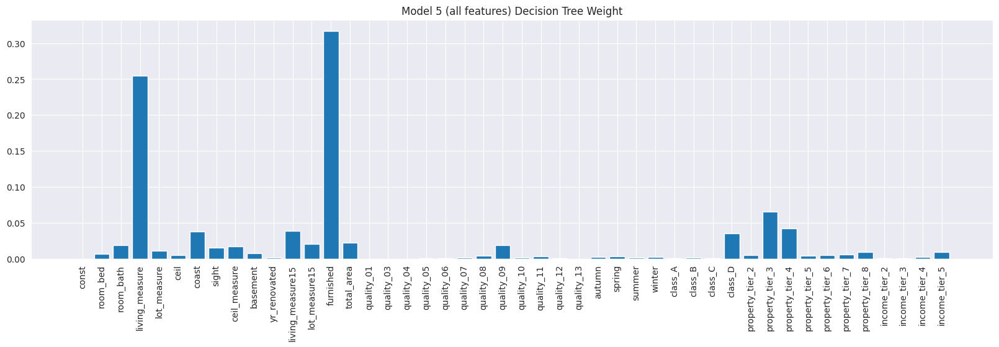

In [501]:
model05_importances = model05_dtree_from_model02.feature_importances_
model05_columns = X_train_ols.columns

model05_importances_df = pd.DataFrame(model05_importances, index = model05_columns, columns = ['Importance']).sort_values(by = 'Importance', ascending = False)
# display(model05_importances_df)

plt.figure(figsize = (20, 5))
plt.xticks(rotation = 90) 
plt.bar(model05_columns, model05_importances)
plt.title('Model 5 (all features) Decision Tree Weight')
plt.show()

## Model 6: Decision Tree from Model 2 (OLS with least features)
Using the X_train data from Model 4: X_train_ols_vif

In [502]:
# Defining the Descision tree regressor
model06_dtree_from_model04 = DecisionTreeRegressor(min_samples_split = 2)

# Fitting Descision Tree regressor to train dataset
model06_dtree_from_model04.fit(X_train_ols_vif,y_train)

DecisionTreeRegressor()

In [503]:
# Insample Prediction
model06_dtree_from_model04_predictions_train = model06_dtree_from_model04.predict(X_train_ols_vif)

# Prediction on test data
model06_dtree_from_model04_predictions_test = model06_dtree_from_model04.predict(X_test_ols_vif)

In [504]:
# Calling personal function to calculare MAE, MAPE, RMSE, R2

model_comparison_table = DsmlFunctions.getModelComparisonMetrics(
    model_comparison_table, 
    6,
    'Decision Tree (from Model 4)',
    y_train, 
    y_test, 
    model06_dtree_from_model04_predictions_train, 
    model06_dtree_from_model04_predictions_test
  )


Model Comparison v6


,MAE,MAPE,RMSE,RSquare
Model 0 Train: 4C KMeans (All Features),542106.433134,99.999467,4.282760e+11,-2.186663
Model 0 Test: 4C KMeans (All Features),534866.586309,99.999464,4.166726e+11,-2.190690
Model 1 Train: 4C KMeans (Auto-Removed),542107.050832,99.999686,4.282764e+11,-2.186665
Model 1 Test: 4C KMeans (Auto-Removed),534867.209717,99.999683,4.166729e+11,-2.190693
Model 2 Train: OLS Linear Regression (Manually Removed),101994.008018,19.949879,2.774914e+10,0.793528
Model 2 Test: OLS Linear Regression (Manually Removed),101284.521270,20.117374,2.750227e+10,0.789400
Model 3 Train: OLS Linear Regression (Removed P-Value > 5%),108932.646903,21.005038,3.234751e+10,0.759313
Model 3 Test: OLS Linear Regression (Removed P-Value > 5%),107570.068287,21.529895,3.064853e+10,0.765307
Model 4 Train: OLS Linear Regression (Removed VIFs),170032.260038,35.172347,6.453058e+10,0.519849
Model 4 Test: OLS Linear Regression (Removed VIFs),166355.920856,35.702954,5.986877e+10,0.541552


For Model 6 vs Model 5 the discrepancies between MAE/MAPE and RSquare improved, but are still behind OLS.

This is expected from a single Decision Tree, so we will run Random Forest as well.

### Decision Tree Plot for mmodel with best result: Model 6 (OLS with least features)

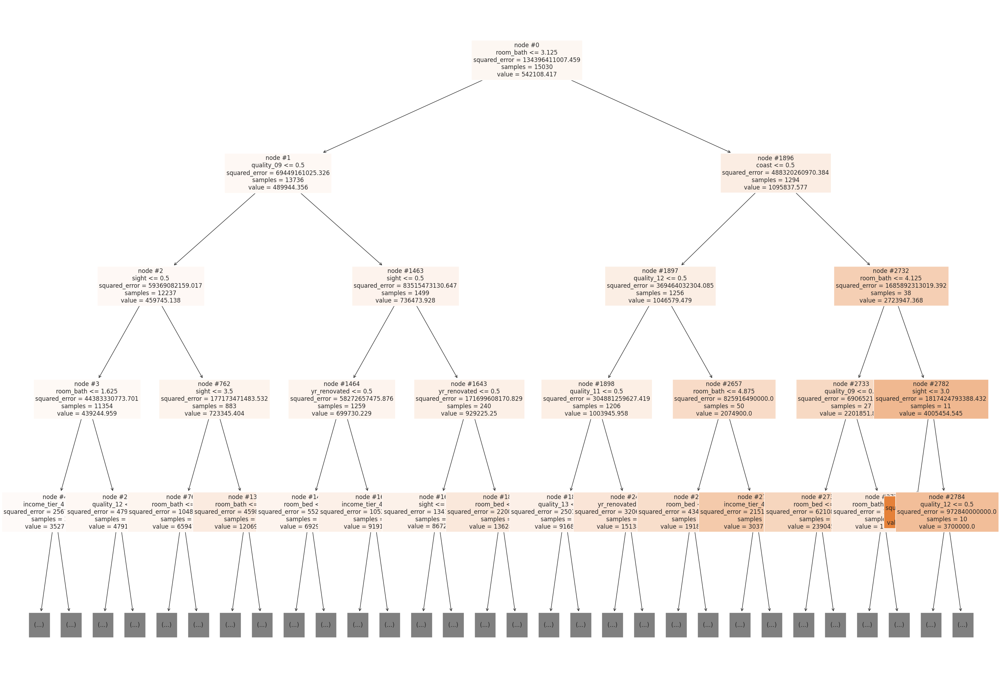

In [505]:
features = list(X_train_ols_vif.columns)

plt.figure(figsize = (35, 25))
plot_tree(model06_dtree_from_model04, max_depth = 4, feature_names = features, filled = True, fontsize = 12, node_ids = True, class_names = True)
plt.show()

Model 6 (OLS least features) - Feature Splits:

- 1.a) room_bath


- 2.a) quality_09
- 2.b) coast


- 3.a) sight
- 3.b) sight
- 3.c) quality_08
- 3.d) room_bath


- 4.a) room_bath
- 4.b) sight
- 4.c) yr_renovated
- 4.d) yr_renovated
- 4.e) quality_12
- 4.f) room_bath
- 4.g) quality_09
- 4.h) sight

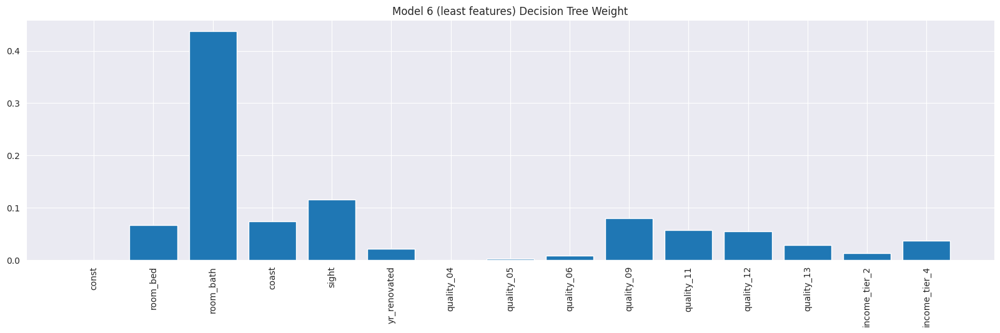

In [506]:
model06_importances = model06_dtree_from_model04.feature_importances_
model06_columns = X_train_ols_vif.columns

model06_importances_df = pd.DataFrame(model06_importances, index = model06_columns, columns = ['Importance']).sort_values(by = 'Importance', ascending = False)
# display(model06_importances_df)

plt.figure(figsize = (20, 5))
plt.xticks(rotation = 90) 
plt.bar(model06_columns, model06_importances)
plt.title('Model 6 (least features) Decision Tree Weight')
plt.show()

Comparing both Decision Trees we can see that:
- From Model 5 (all features):
  - Most important features are furnished, property_tier3/4 and living_measure
  - Half of the tree is defined by living_measure
- From Model 6 (least features):
  - Most important features are room_bath, quality09/08, coast and sight

## Model 7: Random Forest from Model 2 (OLS with all features)
We have Hyperparametized the Random Forest by choosing the features from Model 2

In [507]:
# Defining the Random forest regressor
model07_rforest_from_model02 = RandomForestRegressor(n_estimators = 200, max_depth = 4, min_samples_split = 2)


# Fitting the model
model07_rforest_from_model02.fit(X_train_ols,y_train)

RandomForestRegressor(max_depth=4, n_estimators=200)

Checking the score Train vs Test:

In [508]:
# Checking score vs Test data
model07_rforest_from_model02.score(X_test_ols,y_test)

0.6871280806852473

In [509]:
# Insample Prediction
model07_dtree_from_model02_predictions_train = model07_rforest_from_model02.predict(X_train_ols)

# Prediction on test data
model07_dtree_from_model02_predictions_test = model07_rforest_from_model02.predict(X_test_ols)

In [510]:
# Calling personal function to calculare MAE, MAPE, RMSE, R2

model_comparison_table = DsmlFunctions.getModelComparisonMetrics(
    model_comparison_table, 
    7,
    'Random Forest (from Model 2)',
    y_train, 
    y_test, 
    model07_dtree_from_model02_predictions_train, 
    model07_dtree_from_model02_predictions_test
  )


Model Comparison v7


,MAE,MAPE,RMSE,RSquare
Model 0 Train: 4C KMeans (All Features),542106.433134,99.999467,4.282760e+11,-2.186663
Model 0 Test: 4C KMeans (All Features),534866.586309,99.999464,4.166726e+11,-2.190690
Model 1 Train: 4C KMeans (Auto-Removed),542107.050832,99.999686,4.282764e+11,-2.186665
Model 1 Test: 4C KMeans (Auto-Removed),534867.209717,99.999683,4.166729e+11,-2.190693
Model 2 Train: OLS Linear Regression (Manually Removed),101994.008018,19.949879,2.774914e+10,0.793528
Model 2 Test: OLS Linear Regression (Manually Removed),101284.521270,20.117374,2.750227e+10,0.789400
Model 3 Train: OLS Linear Regression (Removed P-Value > 5%),108932.646903,21.005038,3.234751e+10,0.759313
Model 3 Test: OLS Linear Regression (Removed P-Value > 5%),107570.068287,21.529895,3.064853e+10,0.765307
Model 4 Train: OLS Linear Regression (Removed VIFs),170032.260038,35.172347,6.453058e+10,0.519849
Model 4 Test: OLS Linear Regression (Removed VIFs),166355.920856,35.702954,5.986877e+10,0.541552


## Model 8: Random Forest from Model 4 (OLS with least features)
We have Hyperparametized the Random Forest by choosing the features from Model 4

In [511]:
# Defining the Random forest regressor
model08_rforest_from_model04 = RandomForestRegressor(n_estimators = 200, max_depth = 4, min_samples_split = 2)


# Fitting the model
model08_rforest_from_model04.fit(X_train_ols_vif,y_train)

RandomForestRegressor(max_depth=4, n_estimators=200)

Checking the score Train vs Test:

In [512]:
# Checking score vs Test data
model08_rforest_from_model04.score(X_test_ols_vif,y_test)

0.49121498992289203

In [513]:
# Insample Prediction
model08_dtree_from_model04_predictions_train = model08_rforest_from_model04.predict(X_train_ols_vif)

# Prediction on test data
model08_dtree_from_model04_predictions_test = model08_rforest_from_model04.predict(X_test_ols_vif)

In [514]:
# Calling personal function to calculare MAE, MAPE, RMSE, R2

model_comparison_table = DsmlFunctions.getModelComparisonMetrics(
    model_comparison_table, 
    8,
    'Random Forest (from Model 4)',
    y_train, 
    y_test, 
    model08_dtree_from_model04_predictions_train, 
    model08_dtree_from_model04_predictions_test
  )


Model Comparison v8


,MAE,MAPE,RMSE,RSquare
Model 0 Train: 4C KMeans (All Features),542106.433134,99.999467,4.282760e+11,-2.186663
Model 0 Test: 4C KMeans (All Features),534866.586309,99.999464,4.166726e+11,-2.190690
Model 1 Train: 4C KMeans (Auto-Removed),542107.050832,99.999686,4.282764e+11,-2.186665
Model 1 Test: 4C KMeans (Auto-Removed),534867.209717,99.999683,4.166729e+11,-2.190693
Model 2 Train: OLS Linear Regression (Manually Removed),101994.008018,19.949879,2.774914e+10,0.793528
Model 2 Test: OLS Linear Regression (Manually Removed),101284.521270,20.117374,2.750227e+10,0.789400
Model 3 Train: OLS Linear Regression (Removed P-Value > 5%),108932.646903,21.005038,3.234751e+10,0.759313
Model 3 Test: OLS Linear Regression (Removed P-Value > 5%),107570.068287,21.529895,3.064853e+10,0.765307
Model 4 Train: OLS Linear Regression (Removed VIFs),170032.260038,35.172347,6.453058e+10,0.519849
Model 4 Test: OLS Linear Regression (Removed VIFs),166355.920856,35.702954,5.986877e+10,0.541552


# Model Comparison Conclusion

We know that the more features we include the higher RSquare will be, so we will also consider lower MAE, MAPE and RMSE, as well as the degree of separation between Train and Test data.

- Model 5 was the Decision Tree from Model 2 (OLS LR with all data) had the best results with 99.99% RSquare and only 60 MAE with a 1.58% MAPE. But the difference between Train and Test is significant, dropping the RSquare to 61.9%.
  - Meaning Model 5 is very overfitting.

- The Random Forests did not improve as expected and were actually less than the OLS Linear Regressions, and had a larger difference between Train and Test.

- The selected model will be the Model 2 OLS Linear Regression with manually removed features.
  - We believe we could further improve the model if we remove extreme price level properties.

# Insights

- Taking into account the Decision Trees the most important features are:
  - Model 2 with all features: furnished, property_tier3/4 and living_measure
  - Model 4 with least features: room_bath, quality09/08, coast and sight

- This tells us that the price is most closely related to property livable space, quality, number of restrooms, located to the coast and popularity. 

- The highest prediction percentage was of 79% with the Model 2 OLS Linear Regression, which could be improved by further capping the outliers to have a more normally distributed dataset. 


# Additional Plots

## Cyclical Prices

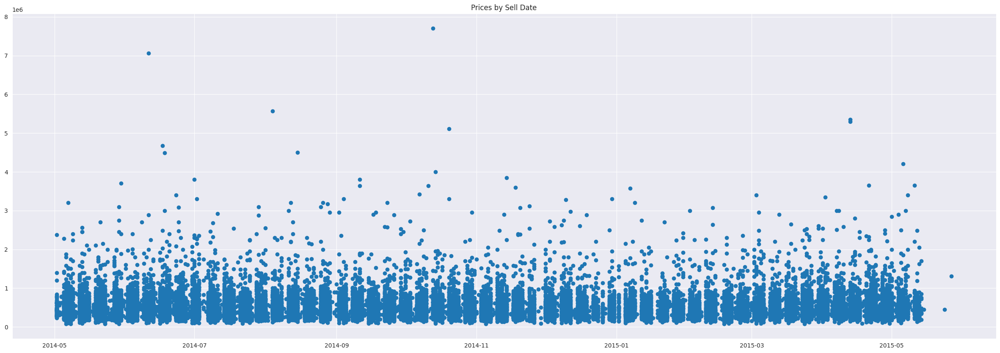

In [515]:
#lets look at one of the price forecasts 
fig = plt.figure(figsize=(30, 10))
plt.scatter(dates, data['price'])
plt.title('Prices by Sell Date')
plt.show()

# Export Colab Notebook as HTML

In [517]:
# First save Notebook locally
# Second upload Notebook file to content folder

# %%shell
# jupyter nbconvert --to html /content/GL_Capstone_Houses_2023.ipynb